# **Project Summary**
This project is used to detect wheat bounding boxes within each image as part of the "global-wheat-detection" Kaggle's competition.

At the beginning of this work, some installations are necessary to enable the running of the whole code, Then, a bunch of imports are needed from the same reason. In this project, we created a lot of deep learning models, including 10 Faster RCNN models (five networks use ResNet50 backbones and the other five use Vgg16 backbones), 5 Detectron2 models, and one YOLOv5 model. Every five models from each type of model described above was created by the same neural network architecture. The only difference between the five is that they were trained on a different set of images from the dataset, and evaluated on the complementary set of images, which is unique for each model, according to the 5-Fold cross-validation method.

In the preprocessing phase, we created a unique class called "WheatDataset" to support reading images from the global-wheat-detection dataset. This class is flexible and enables the "get_item" method to adjust the given image to each data structure used as an input to each model in this project. The WheatDataset has many options: reading the target labels either from a manipulated CSV file or from the original CSV file included in the dataset's directory, converting the images to the preferable type (RGB, BGR, GREY), dividing the images to the requested K-Folds of training and validation sets, if requested, etc. Next to this class, some functions used to create new datasets to get inputs for every model in this project. For example, the Faster RCNN models were trained on 512 X 512 sized images whether the Detectron2 and YOLOv5 models were trained on 1024 X 1024 sized images. We resized the images before the training phase to make the training process faster. Important to add that the YOLOv5 architecture was taken from the ultralytics GitHub repository, and excepts its input to include images and text files compatible with each target, and the data must be ordered uniquely in directories.

After getting the dataset ready for all of the models, we trained our Faster RCNNs using a step learning rate scheduler and a RadAm optimizer (20-22 epochs), our Detectron2 models using Focal Loss and step learning rate scheduler (15,000 iterations) and the YOLOv5 model (95 epochs).
In the next phase of the project we created some functions to evaluate each model and to print F-Measure, True-Positive, False-Positive and False-Negative metrics, using some helper functions we created, as the "iou" function. Next, we wrote each F-Measure to a text file in order to use these values in the test phase as weights in an ensemble of models.

The last phase of this project is the test phase. In this phase, we created a function called "test_ensemble" to test all of the models against the test images. In this function we used TTA optimization which augmented each input image for several times, then we sent each augmented image through each model. After sending the different augmented images, the predicted targets were passed through another augmentation to convert them back to the origin. This method multiplied the number of predictions by the number of TTA augmentations (4 including the original targets). After passing each augmented/original image through each model, we mixed every prediction that belongs to the same family of models using WBF function (Weighted Box Fusion), an 'avg' conf_type, and the F_Measure weights. In more details, we mixed all of the 4 predictions derived from the TTA augmentations for each of the 10 different predictions of the faster RCNN models (Vgg16 / ResNet50 backbones), all of the 4 predictions derived from the TTA augmentations for each of the 5 different predictions of Detectron2 models, and all of the 4 predictions derived from the TTA augmentations using YOLOv5 model (1-Fold). In this period, we had three different predictions for the three "families of models" Faster RCNN, Detectron2, and YOLOv5 models. Then, We passed the three sub-ensemble of models through another run of the WBF function, but this time we used conf_type of 'max' prediction. Eventually, we got these last predictions of the ensemble, converted them to the format of Kaggle's results, and created the CSV submission file.

After reviewing the results on the validation set, the the YOLOv5 model was the most accurate model in terms of F-Measure value (0.95). The model's family with the lowest F-Measure value was the Detectron2 5-Fold models.

[Detectron2 repo](https://github.com/facebookresearch/detectron2)




![](https://www.curiousily.com/static/dff66fd0972574ae284f7df9533d369f/3e3fe/detectron2-logo.png)

[YOLOv5 repo](https://github.com/ultralytics/yolov5)





![](https://user-images.githubusercontent.com/26833433/82944393-f7644d80-9f4f-11ea-8b87-1a5b04f555f1.jpg)

[Torchvision object detection fine tuning tutorial](https://pytorch.org/tutorials/intermediate/torchvision_tutorial.html)





![](https://pytorch.org/tutorials/_static/img/thumbnails/cropped/Introduction-to-TorchScript.png)

# **Installations**

Albumentations


In [ ]:
!pip install albumentations
!pip install -U git+https://github.com/albumentations-team/albumentations

Yolov5

In [ ]:
# Requirements

!pip install torch==1.5.1+cu101 torchvision==0.6.1+cu101 -f https://download.pytorch.org/whl/torch_stable.html
!pip install numpy==1.17
!pip install PyYAML==5.3.1
!pip install git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI

In [ ]:
# Nvidia Apex installation to speed up Yolov5 training

!git clone https://github.com/NVIDIA/apex && cd apex && pip install -v --no-cache-dir --global-option="--cpp_ext" --global-option="--cuda_ext" . --user && cd .. && rm -rf apex

In [ ]:
# Cloning YoloV5 from GitHub

!git clone https://github.com/ultralytics/yolov5

Detectron2

In [ ]:
# Requirements

!pip install -q cython pyyaml==5.1
!pip install pyyaml==5.1 pycocotools>=2.0.1
!pip install -q -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'

In [ ]:
# Cloning Detectron2 from GitHub

!git clone https://github.com/facebookresearch/detectron2 detectron2_repo
!pip install -q -e detectron2_repo

WBF (Weighted Box Fusion)

In [ ]:
!pip install ensemble-boxes

Mount drive

In [ ]:
from google.colab import drive

drive.mount('/content/gdrive')

In [ ]:
!cp -r "/content/gdrive/My Drive/yolov5"/* .

# **Imports**

In [ ]:
# Helpers
import sys
import numpy as np
import PIL 
import cv2
import random
import glob
import pandas as pd
import os
import io
import gc
import csv
import ntpath
import itertools
import shutil as sh
from matplotlib import pyplot as plt
from google.colab import files
from tqdm.auto import tqdm
from itertools import chain, combinations

# YOLOv5
from models.experimental import *
from utils.datasets import *
from utils.utils import *

# Albumentations
import albumentations as A
from albumentations.pytorch.transforms import ToTensorV2

# Modules from pytorch/vision/references/detection/
import transforms as T
from gitradam import RAdam

# Pytorch
import torch
import torch.nn.functional as F
from torch.utils.data.sampler import SequentialSampler, RandomSampler
from torch.utils.data import Dataset, DataLoader

import torchvision
from torchvision import transforms as transforms
import torchvision.models as models
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection import FasterRCNN
from torchvision.models.detection.rpn import AnchorGenerator

# WBF
from ensemble_boxes import *

# Detectron2
import detectron2
import detectron2.data.transforms as DT
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor, DefaultTrainer
from detectron2.config import get_cfg
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader, build_detection_train_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.structures import BoxMode
from detectron2.modeling import build_model
from detectron2.utils.logger import setup_logger
from detectron2.data import DatasetMapper
setup_logger()

%matplotlib inline

Determining the device

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cuda:0


In [ ]:
!nvidia-smi

Wed Aug  5 11:11:54 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 450.57       Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   41C    P0    27W / 250W |     10MiB / 16280MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

# **Consts**

In [ ]:
BATCH_SIZE = 8
TEST_BATCH_SIZE = 1
DEST_IMG_SIZE1 = 512
DEST_IMG_SIZE2 = 224
SRC_IMG_SIZE = 1024
NUM_CLASSES = 2
NUM_IMAGES = 3382

RESNET_PATH1f = "/content/gdrive/My Drive/models/resnet_rcnn/resnet_rcnn_1f.pt"
RESNET_PATH2f = "/content/gdrive/My Drive/models/resnet_rcnn/resnet_rcnn_2f.pt"
RESNET_PATH3f = "/content/gdrive/My Drive/models/resnet_rcnn/resnet_rcnn_3f.pt"
RESNET_PATH4f = "/content/gdrive/My Drive/models/resnet_rcnn/resnet_rcnn_4f.pt"
RESNET_PATH5f = "/content/gdrive/My Drive/models/resnet_rcnn/resnet_rcnn_5f.pt"

VGG_PATH1f = "/content/gdrive/My Drive/models/vgg_rcnn/vgg_rcnn_1f.pt"
VGG_PATH2f = "/content/gdrive/My Drive/models/vgg_rcnn/vgg_rcnn_2f.pt"
VGG_PATH3f = "/content/gdrive/My Drive/models/vgg_rcnn/vgg_rcnn_3f.pt"
VGG_PATH4f = "/content/gdrive/My Drive/models/vgg_rcnn/vgg_rcnn_4f.pt"
VGG_PATH5f = "/content/gdrive/My Drive/models/vgg_rcnn/vgg_rcnn_5f.pt"

DETECTRON_CFG_PATH_1f = "/content/gdrive/My Drive/detectron2_1f"
DETECTRON_CFG_PATH_2f = "/content/gdrive/My Drive/detectron2_2f"
DETECTRON_CFG_PATH_3f = "/content/gdrive/My Drive/detectron2_3f"
DETECTRON_CFG_PATH_4f = "/content/gdrive/My Drive/detectron2_4f"
DETECTRON_CFG_PATH_5f = "/content/gdrive/My Drive/detectron2_5f"

YOLO_PATH = "/content/gdrive/My Drive/yolov5/weights/best_yolov5x_wheat.pt"

F_MEASURES_PATH_FR = "/content/f_measures_fr.txt"
F_MEASURES_PATH_D2 = "/content/‏‏f_measures_d2.txt"

ORIGIN_WHEAT_PATH = "/content/global-wheat-detection"
RESIZED_PATH_224 = "/content/gdrive/My Drive/224-global-wheat-detection"
RESIZED_PATH_512 = "/content/gdrive/My Drive/512-global-wheat-detection"
COLAB_PATH_224 = "/content/224-global-wheat-detection"
COLAB_PATH_512 = "/content/512-global-wheat-detection"
COLAB_DARKNET_DS_PATH = "/content/yolov5x-wheat-dataset"
DARKNET_DS_PATH = "/content/gdrive/My Drive/yolov5x-wheat-dataset"

# **Image Helper Class**

In [ ]:
class Im(object):
    def __init__(self, path):
        self.path = path

        self.rgb_image = None
        self.bgr_image = None
        self.gray_image = None


    def read(self, return_image = False):
        self.rgb_image = plt.imread(self.path)
        if return_image:
            return self.rgb_image


    def bgr(self, return_image = False):
        self.bgr_image = np.flip(plt.imread(self.path), 2)
        if return_image:
            return self.bgr_image


    def gray(self, return_image = False):
        self.gray_image = cv2.cvtColor(plt.imread(self.path), cv2.COLOR_RGB2GRAY)
        if return_image:
            return self.gray_image


    @staticmethod
    def show(image, title = 'image'):
        if len(image.shape) == 3:
            plt.imshow(image)
        else:
            plt.imshow(image, cmap = 'gray')

        plt.axis('off')
        plt.title(title)


    @staticmethod
    def show_all(image_list, title_list, n=-1):
        assert len(image_list) == len(title_list), "Incompatible lengths of lists!"
        assert n <= len(title_list), "Invalid argument n!"

        N = len(image_list)
        if n != -1:
            N = n
        plt.figure(figsize=[20, 20])

        for i in range(N):
            plt.subplot(1, N, i + 1)
            Im.show(image_list[i], title_list[i])
        
        plt.show()

# **Data Manipulations Helper Functions**

In [ ]:
def copy_images(src_path, dest_path, img_types="rgb"):
    # Copies images from src_path to dest_path
    # and converts the images to the given img_type if needed

    paths = glob.glob(src_path + "/*.jpg")
    for p in paths:
        img = cv2.imread(p)
        if img_types == "rgb":
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        elif img_types == "gray":
            img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        img_id = p[p.rfind('/') + 1 : p.rfind('.')]

        plt.imsave(f'{dest_path}/{img_id}.jpg', img)

In [ ]:
def add_imgs_by_wheat_trainloader(dataloader, dest_path):
    # Writes images the from given train dataloader into a given path

    with open(str(dest_path + '/train.csv'), 'w', newline='') as file:
        writer = csv.writer(file)
        writer.writerow(["image_id", "x", "y", "w", "h"])
        
        i = 0
        for x, y, ids in tqdm(dataloader):
            for img, lbl, img_str_id in zip(x, y, ids):
                try:
                    if len(lbl['boxes']) > 0:
                        img_np = cv2.normalize(img.permute(1, 2, 0).numpy(), None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U)
                        p = str(dest_path + '/train/' + img_str_id + '.jpg')
                        for b in lbl['boxes']:
                            writer.writerow([img_str_id, b[0].item(), b[1].item(), b[2].item(), b[3].item()])
                        plt.imsave(p, img_np)
                        print(i, " Added ", str(p))
                        i += 1
                except:
                    print("XXX")
                    continue

In [ ]:
def add_imgs_by_wheat_testloader(dataloader, dest_path):
    # Writes images from the given test dataloader into a given path

    i = 0
    for x, ids in tqdm(dataloader):
        for img, img_str_id in zip(x, ids):
            try:
                p = str(dest_path + '/test/' + img_str_id + '.jpg')
                plt.imsave(p, img)
                print(i, " Added ", str(p))
                i += 1
            except:
                print("XXX")
                continue

In [ ]:
def add_imgs_by_wheat_dataloader_to_darknet_ds(dataloader, dest_path, process):
    # Writes data from a given dataloader into a given path according to the darknet-yolov5 format

    i = 1    
    for x, y, ids in tqdm(dataloader):
        for img, lbl, img_str_id in zip(x, y, ids):
            if len(lbl['boxes']) > 0:
                image_path = f'{dest_path}/images/{process}/{img_str_id}.jpg'
                label_path = f'{dest_path}/labels/{process}/{img_str_id}.txt'
                
                # Save image
                img_np = img.permute(1, 2, 0).numpy()
                plt.imsave(image_path, img_np)

                with open(label_path, 'w') as label_file:
                    for b in lbl['boxes']:
                        # Normalizing data to the darknet format
                        x1, x2 = b[0].item() / img_np.shape[0], b[2].item() / img_np.shape[0]
                        y1, y2 = b[1].item() / img_np.shape[1], b[3].item() / img_np.shape[1]
                        w, h = (x2 - x1), (y2 - y1)
                        x_center, y_center = (x1 + w / 2), (y1 + h / 2)
                        label_file.write(f'0 {x_center} {y_center} {w} {h}\n') # 0 is determined for the wheat class
                
                print(f'{process}-{i} Added {img_str_id}')
                i += 1

In [ ]:
def create_wheat_ds(src_path, dest_path, dest_type="rgb", transforms=None, process="train"):
    # Creates a dataset in the given dest_path using the images of an existing dataset in src_path.
    # The given process name defines the name of the new directory ("train" / "test").
    # The images in the new dataset are converted to dest_type (gray, bgr, rgb) if needed and
    # passed through augmentations according to the given transforms.

    new_ds = WheatDataset(src_path, dest_type, transform=transforms, divide=False, preprocessing=True, process=process) # Dataset in src_path
    new_dl = DataLoader(new_ds, batch_size=BATCH_SIZE, shuffle=False, num_workers=8, collate_fn=collate_fn) # Dataloader
    
    # Adds images to a new dataset in dest_path
    if process == "train":
        add_imgs_by_wheat_trainloader(new_dl, dest_path)
    elif process == "test":
        add_imgs_by_wheat_testloader(new_dl, dest_path)

In [ ]:
def create_wheat_darknet_ds(src_path, dest_path, dest_type="rgb", transforms=None):
    # Creates a dataset in the given dest_path using the images of an existing dataset in src_path,
    # according to the darknet-yolov5 format of dataset.
    # The given process name defines the name of the new directory ("train" / "test").
    # The images in the new dataset are converted to dest_type (gray, bgr, rgb) if needed and
    # passed through augmentations according to the given transforms.

    # Train dataset
    train_ds = WheatDataset(src_path, dest_type, transform=transforms, divide=True, preprocessing=True, process="train")
    train_dl = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=False, num_workers=8, collate_fn=collate_fn)

    # Validation dataset
    val_ds = WheatDataset(src_path, dest_type, transform=transforms, divide=True, preprocessing=True, process="val")
    val_dl = DataLoader(val_ds, batch_size=BATCH_SIZE, shuffle=False, num_workers=8, collate_fn=collate_fn)

    # Adds images to new dataset in dest_path according to the darknet format
    add_imgs_by_wheat_dataloader_to_darknet_ds(train_dl, dest_path, "train")
    add_imgs_by_wheat_dataloader_to_darknet_ds(val_dl, dest_path, "val")

In [ ]:
def draw_bboxes(img, boxes, text=None, text_size=None, thickness=3):
    # Draws all the given bounding boxes (boxes) within the given image (img), using a thickness value,
    # a text list corresponding with each bounding box, and its size
    
    new_img = img.copy()
    for b, t in zip(boxes, text):
        start_point = (int(b[0].item()), int(b[1].item()))
        end_point = (int(b[2].item()), int(b[3].item()))
        color = (0, 255, 255) 
        new_img = cv2.rectangle(new_img, start_point, end_point, color, thickness)
        if text is not None and text_size is not None:
            cv2.putText(new_img, t, (int(b[0].item()), int(b[1].item()) - 2), cv2.FONT_HERSHEY_SIMPLEX, text_size, (0, 255, 255), 4)
    
    return new_img

Dataset Class Definition

In [ ]:
def collate_fn(batch):
    return tuple(zip(*batch))

In [ ]:
class WheatDataset(Dataset):
    def __init__(self, root_path, dest_type, transform=None, process="train", divide=False, k=5, k_pos=0, csv=None, csv_coco_format=True, preprocessing=False, return_tensor=True):
        # root_path is the root path of the wheat dataset.
        # dest_type is the requested type for images in the dataset ('bgr', 'gray', 'rgb').
        # transform is the augmentations to pass images through.
        # divide is to determine wether to divide the dataset into train/validation or not.
        # Wיhen process = "train"/"val" and k, k_pos are given --> if divide is TRUE --> determines the "train-validation" division of paths
        # according to k-fold cross validation. k_pos is the start position of the validation set in the list of all paths.
        # There are k different k_pos within the list of paths.
        # process = "test" causes get_item() method to return only the current image and its id.
        # csv is a csv file, written in the form: 'image_id', 'x', 'y', 'w', 'h' (a different format from one's given by Kaggle's).
        # If csv is None then the WheatDataset reads the Kaggle's csv according to the root_path.
        # preprocessing togather with a "train" process determines whether it is necessary to return image_id from get_item() method or not.
        # csv_coco_format and the given csv argument determine together if a format conversion is needed for using the data.
        # return_tensor determines if the returning arrays of the image and its targets should be a tensor or not 
        
        assert root_path is not dest_type, "Paths need to be unique!"
        assert dest_type in ['rgb', 'bgr', 'gray'], "Invalid types!"
        assert process in ['train', 'val', 'test'], "Invalid process!"
        assert k_pos < k, "Incompatible ratio between k and k_pos!"

        super(WheatDataset, self).__init__()
        self.transform = transform
        self.process = process
        self.dest_type = dest_type
        self.preprocessing = preprocessing
        self.is_pascal = not csv_coco_format
        self.return_tensor = return_tensor

        self.csv = csv
        if self.process != "test":
            self.paths = glob.glob(root_path + "/train/*.jpg")

            if csv is None:
                self.csv = WheatDataset.adjust_csv(root_path + '/train.csv')
            if divide:
                if self.process == "train":
                    before_pos = self.paths[: len(self.paths) * k_pos // k]
                    after_pos = self.paths[len(self.paths) * (k_pos + 1) // k : len(self.paths)]
                    self.paths = before_pos + after_pos
                elif self.process == "val":
                    self.paths = self.paths[len(self.paths) * k_pos // k : len(self.paths) * (k_pos + 1) // k]
        elif self.process == "test":
            self.paths = glob.glob(root_path + "/test/*.jpg")

        if not self.preprocessing:      
            random.shuffle(self.paths) # Shuffle the paths

    
    @staticmethod
    def adjust_csv(path):
        # Given a path for the wheat csv file,
        # Returns the deserved csv to extract data from

        # Reads csv file from path
        new_csv = pd.read_csv(path)

        # Gets an array of arrays of all bboxes in the form [[x], [y], [w], [h]]
        bboxes = np.stack(new_csv['bbox'].apply(lambda x: np.fromstring(x[1:-1], sep = ',')))

        # Saves the values in the respective column
        for i, col in enumerate(['x', 'y', 'w', 'h']):
            new_csv[col] = bboxes[:, i]

        new_csv.drop(columns=['bbox'], inplace=True)
        new_csv.drop(columns=['source'], inplace=True)
        new_csv.drop(columns=['width'], inplace=True)
        new_csv.drop(columns=['height'], inplace=True)

        return new_csv


    def get_compatible_targets(self, img_id, idx):
        # Gets compatible targets by img_id as a key

        if self.process == "train" or self.process == "val":
            boxes, labels, area, iscrowd = list(), list(), 0, list()
            temp_csv = self.csv.loc[self.csv['image_id'] == img_id]
            boxes = temp_csv[['x', 'y', 'w', 'h']].values

            if len(boxes) > 0 and not self.is_pascal:
                # Converting from Coco to Pascal_voc format
                boxes[:, 2] = boxes[:, 0] + boxes[:, 2]
                boxes[:, 3] = boxes[:, 1] + boxes[:, 3]
                area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])

            boxes = torch.as_tensor(boxes, dtype=torch.float32)
            labels = torch.ones(boxes.shape[0], dtype=torch.int64) # One class (Wheat)
            iscrowd = torch.zeros(boxes.shape[0], dtype=torch.int64) # suppose all instances are not crowd

            target = dict()
            target["boxes"] = boxes
            target["labels"] = labels
            target["image_id"] = torch.tensor(idx)
            target["area"] = torch.tensor(area)
            target["iscrowd"] = iscrowd

            return target


    def __getitem__(self, idx):
        p = self.paths[idx]
        x = cv2.imread(p)
        if self.dest_type is 'rgb':
            x = cv2.cvtColor(x, cv2.COLOR_BGR2RGB)
        elif self.dest_type is 'gray':
            x = cv2.cvtColor(x, cv2.COLOR_BGR2GRAY)
        
        img_str_id = p[p.rfind('/') + 1 : p.rfind('.')]

        if self.process == "train" or self.process == "val":
            y = self.get_compatible_targets(img_str_id, idx)
            
            if self.transform is not None:
                sample = self.transform(**{
                    'image': x,
                    'bboxes': y['boxes'],
                    'labels': y['labels'],
                    'area': y['area'],
                    'crowd': y['iscrowd'],
                    'id': y['image_id']
                })
                
                x = sample['image']
                y['boxes'] = torch.as_tensor(sample['bboxes'], dtype=torch.float32)
                y['area'] = torch.as_tensor(sample['area'], dtype=torch.float32)
                y['iscrowd'] = torch.as_tensor(sample['crowd'], dtype=torch.int64)
                y['labels'] = torch.as_tensor(sample['labels'], dtype=torch.int64)
                y['image_id'] = torch.as_tensor(sample['id'], dtype=torch.int64)

            if self.return_tensor:
                x, y = T.ToTensor()(x, y)

            if self.preprocessing:
                return x, y, img_str_id
            return x, y
        elif self.process == "test":
            if self.transform is not None:
                sample = self.transform(**{
                    'image': x
                })
                x = sample['image']

            if self.return_tensor:
                to_tensor = A.Compose([ToTensorV2(p=1.0, always_apply=True)])(**{ 'image': x })            
                x = to_tensor['image']

            return x, img_str_id # No label


    def __len__(self):
        return len(self.paths)

Augmentations' Definition

In [ ]:
train_augs = A.Compose([                
    A.RandomBrightness(limit=0.08),
    A.RandomContrast(limit=0.08),
    A.HueSaturationValue(3, 3, 3),
    A.Rotate(180),
    A.VerticalFlip(),
    A.HorizontalFlip(),
    A.RandomSizedCrop((DEST_IMG_SIZE1 - 70, DEST_IMG_SIZE1 - 70), DEST_IMG_SIZE1, DEST_IMG_SIZE1, interpolation=cv2.INTER_CUBIC),
    A.Resize(DEST_IMG_SIZE1, DEST_IMG_SIZE1, p=1, always_apply=True)],
    
    p=1.0, 
    bbox_params=A.BboxParams(
    format='pascal_voc',
    min_area=0, 
    min_visibility=0,
    label_fields=['labels']))

Creates a resized dataset to spare time while learning

In [ ]:
# Resizing the train images
create_wheat_ds(ORIGIN_WHEAT_PATH, RESIZED_PATH_512, dest_type='rgb', transforms=A.Compose(A.Resize(DEST_IMG_SIZE1, DEST_IMG_SIZE1, p=1, always_apply=True)), process="test"), process="train")

In [ ]:
# Resizing the test images
create_wheat_ds(ORIGIN_WHEAT_PATH, RESIZED_PATH_512, dest_type='rgb', transforms=A.Compose(A.Resize(DEST_IMG_SIZE1, DEST_IMG_SIZE1, p=1, always_apply=True)), process="test"), process="test")

In [ ]:
# Darknet-Yolo Dataset
create_wheat_darknet_ds(ORIGIN_WHEAT_PATH, DARKNET_DS_PATH, dest_type='rgb', transforms=None)

# **Showing examples from the Dataset**

Before augmentations / resizing

In [ ]:
# Wheat train dataloader creation
wheat_trainset = WheatDataset(ORIGIN_WHEAT_PATH, dest_type='rgb', transform=None, divide=True)

# Wheat train dataloader creation
wheat_trainloader = DataLoader(wheat_trainset, batch_size=BATCH_SIZE, shuffle=True, num_workers=8, collate_fn=collate_fn)

In [ ]:
# Wheat validation dataloader creation
wheat_valset = WheatDataset(ORIGIN_WHEAT_PATH, dest_type='rgb', transform=None, divide=True, process="val")

# Wheat validation dataloader creation
wheat_valloader = DataLoader(wheat_valset, batch_size=BATCH_SIZE, shuffle=False, num_workers=8, collate_fn=collate_fn)

In [ ]:
# Wheat test dataloader creation
wheat_testset = WheatDataset(ORIGIN_WHEAT_PATH, dest_type='rgb', transform=A.Compose([ToTensorV2(p=1.0, always_apply=True)]), process="test")

# Wheat test dataloader creation
wheat_testloader = DataLoader(wheat_testset, batch_size=BATCH_SIZE, shuffle=False, num_workers=8, collate_fn=collate_fn)

In [ ]:
print("Sizes:\n\n", "len(train)=", len(wheat_trainset), "\n", "len(val)=", len(wheat_valset), "\n", "len(test)=", len(wheat_testset))

Sizes:

 len(train)= 2738 
 len(val)= 684 
 len(test)= 10


In [ ]:
# Train
it_train = iter(wheat_trainloader)
imgs_train, lbls_train = next(it_train)

In [ ]:
new_imgs_train = list()
for img in imgs_train:
    new_imgs_train.append(cv2.normalize(img.permute(1, 2, 0).numpy(), None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U))

In [ ]:
titles_train = list()
for l, im in zip(lbls_train, new_imgs_train):
    titles_train.append(str(l['image_id'].item()) + ", Shape: " + str(im.shape))

Train examples

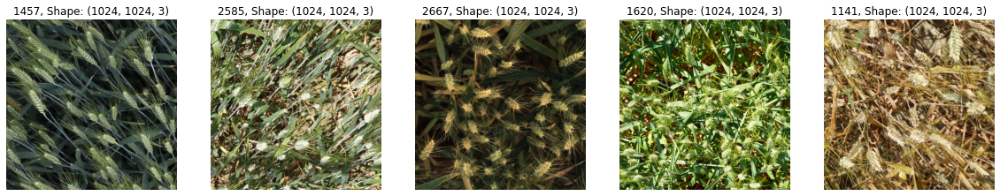

In [ ]:
Im.show_all(new_imgs_train, titles_train, n=5)

In [ ]:
wheat_detected_train = list()
for img, lbl in zip(new_imgs_train, lbls_train):
    wheat_detected_train.append(draw_bboxes(img, lbl['boxes'], thickness=5))

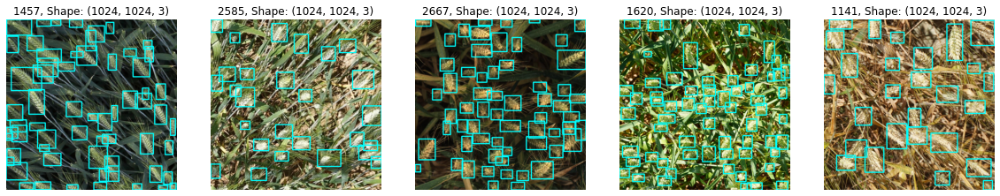

In [ ]:
Im.show_all(wheat_detected_train, titles_train, n=5)

In [ ]:
# Validation
it_val = iter(wheat_valloader)
imgs_val, lbls_val = next(it_val)

In [ ]:
new_imgs_val = list()
for img in imgs_val:
    new_imgs_val.append(cv2.normalize(img.permute(1, 2, 0).numpy(), None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U))

In [ ]:
titles_val = list()
for l, im in zip(lbls_val, new_imgs_val):
    titles_val.append(str(l['image_id'].item()) + ", Shape: " + str(im.shape))

Validation examples

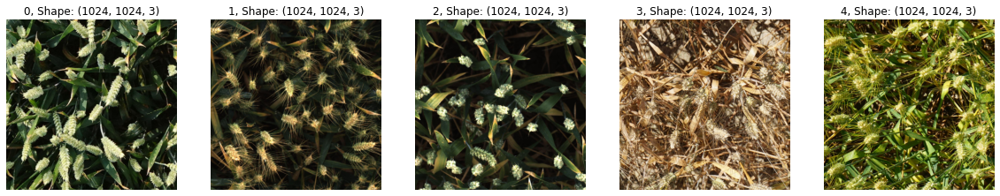

In [ ]:
Im.show_all(new_imgs_val, titles_val, n=5)

In [ ]:
wheat_detected_val = list()
for img, lbl in zip(new_imgs_val, lbls_val):
    wheat_detected_val.append(draw_bboxes(img, lbl['boxes'], thickness=5))

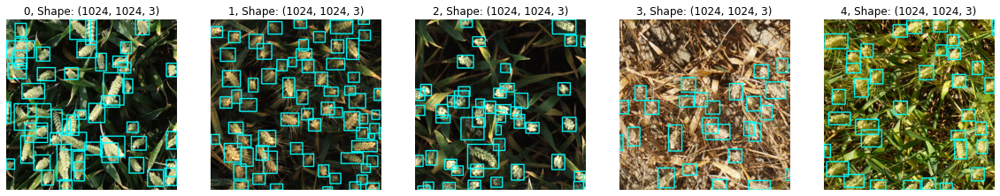

In [ ]:
Im.show_all(wheat_detected_val, titles_val, n=5)

In [ ]:
# Test
it_test = iter(wheat_testloader)
imgs_test, titles_test = next(it_test)

In [ ]:
imgs_test[0].shape

torch.Size([3, 1024, 1024])

In [ ]:
new_imgs_test = list()
for img in imgs_test:
    new_imgs_test.append(cv2.normalize(img.permute(1, 2, 0).numpy(), None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U))

Test examples

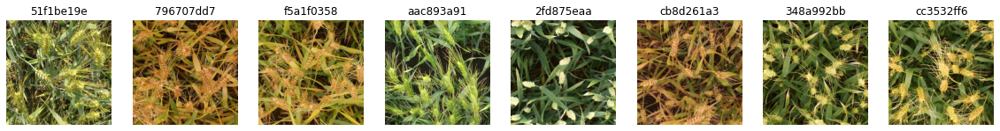

In [ ]:
Im.show_all(new_imgs_test, titles_test)

In [ ]:
# Wheat train dataloader creation
wheat_trainset = WheatDataset(RESIZED_PATH_512, dest_type='rgb', transform=None, divide=True, csv=pd.read_csv(RESIZED_PATH_512 + "/train.csv"), csv_coco_format=False)

# Wheat train dataloader creation
wheat_trainloader = DataLoader(wheat_trainset, batch_size=BATCH_SIZE, shuffle=True, num_workers=8, collate_fn=collate_fn)

In [ ]:
# Wheat validation dataloader creation
wheat_valset = WheatDataset(RESIZED_PATH_512, dest_type='rgb', transform=None, divide=True, process="val", csv=pd.read_csv(RESIZED_PATH_512 + "/train.csv"), csv_coco_format=False)

# Wheat validation dataloader creation
wheat_valloader = DataLoader(wheat_valset, batch_size=BATCH_SIZE, shuffle=False, num_workers=8, collate_fn=collate_fn)

In [ ]:
# Wheat test dataloader creation
wheat_testset = WheatDataset(RESIZED_PATH_512, dest_type='rgb', transform=A.Compose([ToTensorV2(p=1.0, always_apply=True)]), process="test")

# Wheat test dataloader creation
wheat_testloader = DataLoader(wheat_testset, batch_size=BATCH_SIZE, shuffle=False, num_workers=8, collate_fn=collate_fn)

In [ ]:
print("Sizes:\n\n", "len(train)=", len(wheat_trainset), "\n", "len(val)=", len(wheat_valset), "\n", "len(test)=", len(wheat_testset))

Sizes:

 len(train)= 2698 
 len(val)= 674 
 len(test)= 10


In [ ]:
# Train
it_train = iter(wheat_trainloader)
imgs_train, lbls_train = next(it_train)

In [ ]:
new_imgs_train = list()
for img in imgs_train:
    new_imgs_train.append(cv2.normalize(img.permute(1, 2, 0).numpy(), None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U))

In [ ]:
titles_train = list()
for l, im in zip(lbls_train, new_imgs_train):
    titles_train.append(str(l['image_id'].item()) + ", Shape: " + str(im.shape))

Train examples

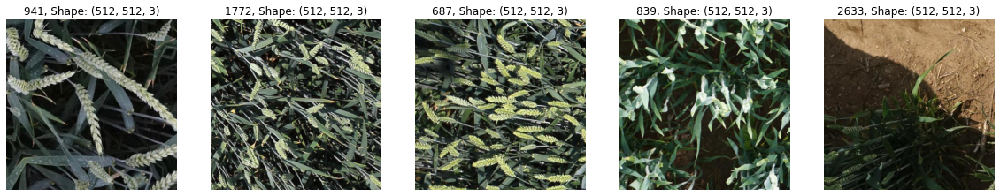

In [ ]:
Im.show_all(new_imgs_train, titles_train, n=5)

In [ ]:
wheat_detected_train = list()
for img, lbl in zip(new_imgs_train, lbls_train):
    wheat_detected_train.append(draw_bboxes(img, lbl['boxes'], text='Wheat', thickness=3))

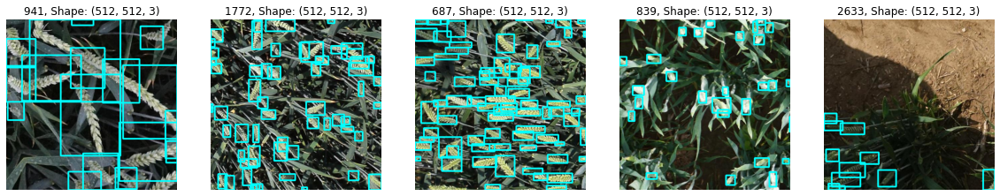

In [ ]:
Im.show_all(wheat_detected_train, titles_train, n=5)

In [ ]:
# Validation
it_val = iter(wheat_valloader)
imgs_val, lbls_val = next(it_val)

In [ ]:
new_imgs_val = list()
for img in imgs_val:
    new_imgs_val.append(cv2.normalize(img.permute(1, 2, 0).numpy(), None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U))

In [ ]:
titles_val = list()
for l, im in zip(lbls_val, new_imgs_val):
    titles_val.append(str(l['image_id'].item()) + ", Shape: " + str(im.shape))

Validation examples

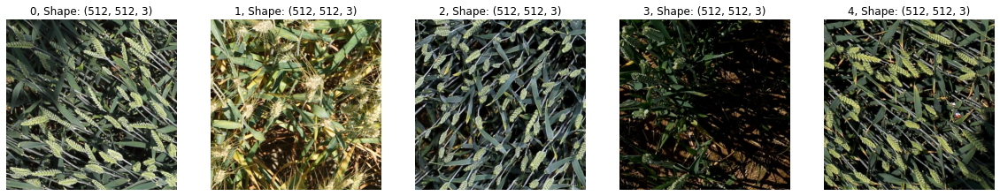

In [ ]:
Im.show_all(new_imgs_val, titles_val, n=5)

In [ ]:
wheat_detected_val = list()
for img, lbl in zip(new_imgs_val, lbls_val):
    wheat_detected_val.append(draw_bboxes(img, lbl['boxes'], thickness=3))

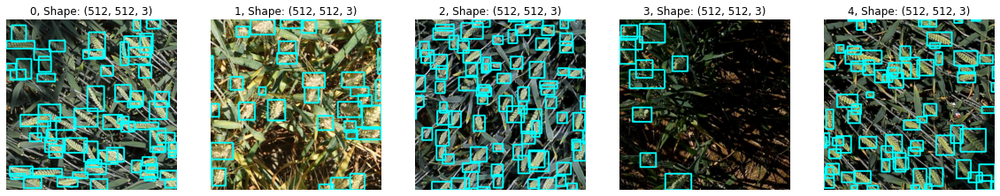

In [ ]:
Im.show_all(wheat_detected_val, titles_val, n=5)

In [ ]:
# Test
it_test = iter(wheat_testloader)
imgs_test, titles_test = next(it_test)

In [ ]:
imgs_test[0].shape

torch.Size([3, 512, 512])

In [ ]:
new_imgs_test = list()
for img in imgs_test:
    new_imgs_test.append(cv2.normalize(img.permute(1, 2, 0).numpy(), None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U))

Test examples

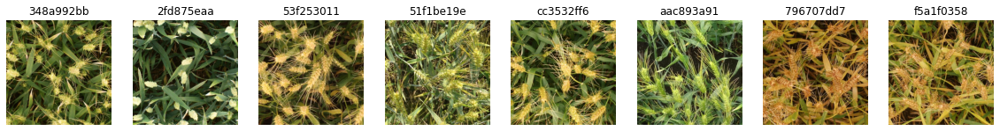

In [ ]:
Im.show_all(new_imgs_test, titles_test)

# **Helper functions**

In [ ]:
def clear_ram(model):
    # Clears the RAM / Cache and deletes the given model

    del model # Free backbone model
    gc.collect() # Free memory in cpu
    torch.cuda.empty_cache() # Free memory in gpu

In [ ]:
def filter_targets(boxes, scores, thresh=0.4):
    # Filters the given boxes and scores by the given threshold, and returns the filtered results
    
    filtered_boxes, filtered_scores = list(), list()
    for b, s in zip(boxes, scores):
        if s > thresh:
            filtered_boxes.append(b)
            filtered_scores.append(s)

    filtered_boxes = np.asarray(filtered_boxes)
    filtered_scores = np.asarray(filtered_scores)
    filtered_labels = np.ones(len(filtered_boxes), dtype=np.uint8)

    return filtered_boxes, filtered_scores, filtered_labels

In [ ]:
def iou(box1, box2):
    # Calculates IoU of the given two tensor boxes

    box1 = list(map(lambda val: int(val.item()), box1))
    box2 = list(map(lambda val: int(val.item()), box2))
    x1min, y1min, x1max, y1max = box1
    x2min, y2min, x2max, y2max = box2

    if max(x1min, x2min) > min(x1max, x2max) or max(y1min, y2min) > min(y1max, y2max): # There is no intersection
        return 0

    intersection = (min(x1max, x2max) - max(x1min, x2min)) * (min(y1max, y2max) - max(y1min, y2min))
    union = (x1max - x1min) * (y1max - y1min) + (x2max - x2min) * (y2max - y2min) - intersection # area1 + area2 - intersection
    
    return intersection / (union + 1e-9)

Training Function for Faster RCNN models

In [ ]:
 def train(model, sched, optimizer, dataloader, device, cp_path, convergence_lst, num_epochs=20, from_epoch=0):
    # cp_path is the checkpoint path for saving the model while learning.
    # convergence_lst is a losses' list of the model while training
    
    i = 0
    loss_dict = None
    loss_value = None

    model.train()
    for epoch in range(from_epoch, num_epochs):
        for images, targets in tqdm(dataloader):
            images = [image.to(device) for image in images]
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]       
            
            loss_dict = model(images, targets)
            losses = sum(loss for loss in loss_dict.values())

            # Reduce losses for logging purposes
            loss_dict_reduced = U.reduce_dict(loss_dict)
            losses_reduced = sum(loss for loss in loss_dict_reduced.values())
            loss_value = losses_reduced.item()
            convergence_lst.append(loss_value)

            # Printing loss metrics
            if i % 20 == 0:
                print(f'Epoch no\'{epoch}, batch loss: {loss_value}')
                
            optimizer.zero_grad()
            losses.backward()
            optimizer.step()
            i += 1
                
        sched.step()

        # Saving the model in case of 'out of memory'
        torch.save({
            'epoch': epoch,
            'model': model.state_dict(),
            'optimizer': optimizer.state_dict(),
            'scheduler': sched.state_dict(),
            'loss': loss_dict,
            'convergence': convergence_lst}, cp_path)

Wheat detection function (For the use of YOLOv5 model)

In [ ]:
def detect1Image(im0, imgsz, model, device, conf_thres, iou_thres):
    # Given an input image (im0), its size (imgsz), a model, a device, a score conf_thresh and an iou_thresh
    # Returns the detection prediction of the model on the input image, filtered by both of the thresholds, using the device

    img = letterbox(im0, new_shape=imgsz)[0]
    # Convert
    img = img[:, :, ::-1].transpose(2, 0, 1)  # BGR to RGB, to 3x416x416
    img = np.ascontiguousarray(img)


    img = torch.from_numpy(img).to(device)
    img =  img.float()  # uint8 to fp16/32
    img /= 255.0   
    if img.ndimension() == 3:
        img = img.unsqueeze(0)

    # Inference
    pred = model(img, augment=False)[0]

    # Apply NMS
    pred = non_max_suppression(pred, conf_thres, iou_thres)

    boxes = []
    scores = []
    for i, det in enumerate(pred):  # detections per image
        # save_path = 'draw/' + image_id + '.jpg'
        if det is not None and len(det):
            # Rescale boxes from img_size to im0 size
            det[:, :4] = scale_coords(img.shape[2:], det[:, :4], im0.shape).round()

            # Write results
            for *xyxy, conf, cls in det:
                boxes.append([int(xyxy[0]), int(xyxy[1]), int(xyxy[2]), int(xyxy[3])])
                scores.append(conf)

    return np.array(boxes), np.array(scores) 

In [ ]:
def detect1Image_aug(im0, imgsz, model, device, conf_thres, iou_thres):
    # Given an input image (im0), its size (imgsz), a model, a device, a score conf_thresh and an iou_thresh
    # Returns the detection prediction of the model on the input image, filtered by both of the thresholds, using the device and nms method

    img = letterbox(im0, new_shape=imgsz)[0]
    # Convert
    img = img[:, :, ::-1].transpose(2, 0, 1)  # BGR to RGB, to 3x416x416
    img = np.ascontiguousarray(img)


    img = torch.from_numpy(img).to(device)
    img =  img.float()  # uint8 to fp16/32
    img /= 255.0   
    if img.ndimension() == 3:
        img = img.unsqueeze(0)

    # Inference
    pred = model(img, augment=True)[0]

    # Apply NMS
    pred = non_max_suppression(pred, conf_thres, iou_thres)

    boxes = []
    scores = []
    for i, det in enumerate(pred):  # detections per image
        # save_path = 'draw/' + image_id + '.jpg'
        if det is not None and len(det):
            # Rescale boxes from img_size to im0 size
            det[:, :4] = scale_coords(img.shape[2:], det[:, :4], im0.shape).round()

            # Write results
            for *xyxy, conf, cls in det:
                boxes.append([int(xyxy[0]), int(xyxy[1]), int(xyxy[2]), int(xyxy[3])])
                scores.append(conf)

    return np.array(boxes), np.array(scores) 

Evaluating functions

In [ ]:
def evaluate_batch_fr(preds, lbls, image_shape, iou_thresh=0.55, score_thresh=0.45, weights=(1, 1), device="cpu"):
    # Calculates f-measure for a batch of images, using predictions of a Faster RCNN model.
    # preds = predicted targets, lbls = labeled targets, thresh = IoU threshold.
    # weights is a tuple of weights for both precision and recall.
    # device --> the device to use for calculating the results.

    true_lbls = set() # Labels (booxes) which predicted correctly by the model
    true_preds = set() # Correct predictions (booxes) by the model
    lbls_num = 0
    preds_num = 0
        
    # If there are both predicted and labeled bounding boxes in the current image
    for p, l in zip(preds, lbls):
        lbls_num += len(l['boxes'])
        preds_num += len(p['boxes'])

        boxes = [b / image_shape for b in p['boxes']] # Normalizing boxes to match WBF function
        boxes, scores, labels = weighted_boxes_fusion([boxes], [p['scores']], [np.ones(len(p['boxes']), dtype=np.uint8)], weights=None, conf_type='max', iou_thr=iou_thresh, skip_box_thr=score_thresh)
        boxes = [torch.from_numpy(b * image_shape) for b in boxes]

        for bp in boxes:
            for bl in l['boxes']:
                iou_ = iou(bl, bp)
                # If value of iou is relevant (above thresh) and if there is no prediction yet compatible with this current label bl
                if (iou_ > iou_thresh) and not (bl in true_lbls):
                    true_lbls.add(bl)
                    true_preds.add(bp)
                    break # Found possible iou for current prediction bp

    true_positives = len(true_lbls)
    false_positives = preds_num - len(true_preds)
    false_negatives = lbls_num - len(true_lbls)
        
    precision = true_positives / (1e-9 + false_positives + true_positives)
    recall = true_positives / (1e-9 + false_negatives + true_positives)

    f_measure = (weights[0] * precision + weights[1] * precision) / (weights[0] + weights[1]) 
    return f_measure, true_positives, false_positives, false_negatives

In [ ]:
def evaluate_batch_d2(images, lbls, predictor, iou_thresh=0.45, score_thresh=0.45, weights=(1, 1), device="cpu"):
    # Calculates f-measure for a batch of images for a Detectron2 predictor, using the given thresholds.
    # preds = predicted targets, lbls = labeled targets.
    # weights is a tuple of weights for both precision and recall.
    # device --> the device to use for calculating the results.

    true_positives, false_positives, false_negatives = 0, 0, 0

    for img, t in zip(images, lbls):
        pred = predictor(img)
        fields = pred['instances'].get_fields()

        if len(t['boxes']) == 0 and len(fields['pred_boxes']) == 0: # No bounding boxes in the image --> the model was right
            continue

        true_preds = set() # Correct predictions (booxes) by the model
        true_lbls = set() # Labels that predicted correctly by the model
        lbls_num = 0
        preds_num = 0

        boxes = fields['pred_boxes'].tensor.data.cpu().numpy()
        boxes = [b / img.shape[1] for b in boxes] # Normalizing boxes to match WBF function
        scores = fields['scores'].data.cpu().numpy()
        labels = np.ones(len(boxes), dtype=np.uint8)
        boxes, scores, labels = weighted_boxes_fusion([boxes], [scores], [labels], weights=None, conf_type='max', iou_thr=iou_thresh, skip_box_thr=score_thresh)
        boxes = [torch.from_numpy(b * img.shape[1]) for b in boxes] # De-normalizing boxes for IoU checking
        
        lbls_num += len(t['boxes'])
        preds_num += len(boxes)

        for bp in boxes:
            for bl in t['boxes']:
                iou_ = iou(bl, bp)

                # If the value of iou is greater than the given iou_thresh,
                # and if the current label yet doesn't match to any other prediction
                if (iou_ > iou_thresh) and not (bl in true_lbls):
                    true_preds.add(bp)
                    true_lbls.add(bl)
                    break # Found a possible iou for the current prediction bp --> match bp and bl

        true_positives += len(true_lbls)
        false_positives += preds_num - len(true_preds)
        false_negatives += lbls_num - len(true_preds)
        
    precision = true_positives / (1e-9 + false_positives + true_positives)
    recall = true_positives / (1e-9 + false_negatives + true_positives)

    f_measure = (weights[0] * precision + weights[1] * precision) / (weights[0] + weights[1]) 
    return f_measure, true_positives, false_positives, false_negatives

In [ ]:
def evaluate_yolo(valloader, model, iou_thresh=0.45, score_thresh=0.45, weights=(1, 1), device="cpu"):
    # Calculates f-measure of a given YOLOv5 model on a given validation dataloader, using the given thresholds.
    # weights is a tuple of weights for both precision and recall.
    # device --> the device to use for calculating the results.

    true_positives, false_positives, false_negatives = 0, 0, 0

    for images, targets in tqdm(valloader):
        for img, t in zip(images, targets):
            boxes, scores = detect1Image(img, img.shape[1], model, device, score_thresh, iou_thresh)
            scores = [s.cpu().item() for s in scores]

            if len(t['boxes']) == 0 and len(boxes) == 0: # No bounding boxes in the image --> the model was right
                continue

            true_preds = set() # Correct predictions (booxes) by the model
            true_lbls = set() # Labels that predicted correctly by the model
            lbls_num = 0
            preds_num = 0
            
            lbls_num += len(t['boxes'])
            preds_num += len(boxes)

            for bp in boxes:
                for bl in t['boxes']:
                    iou_ = iou(bl, bp)

                    # If the value of iou is greater than the given iou_thresh,
                    # and if the current label yet doesn't match to any other prediction
                    if (iou_ > iou_thresh) and not (bl in true_lbls):
                        true_preds.add(torch.from_numpy(bp))
                        true_lbls.add(bl)
                        break # Found a possible iou for the current prediction bp --> match bp and bl

            true_positives += len(true_lbls)
            false_positives += preds_num - len(true_preds)
            false_negatives += lbls_num - len(true_preds)
        
    precision = true_positives / (1e-9 + false_positives + true_positives)
    recall = true_positives / (1e-9 + false_negatives + true_positives)

    f_measure = (weights[0] * precision + weights[1] * precision) / (weights[0] + weights[1]) 
    return f_measure, true_positives, false_positives, false_negatives

In [ ]:
def evaluate(model, valloader, is_d2_predictor=False, device="cpu"):
    # Given a model (Faster RCNN or a Detectron2), a validation datasloader, 
    # and a boolean argument (is_d2_predictor) to determine wether the model is a Detectron2's predictor or not,
    # Returns the average f-measure of the model calculated on the given validation dataloader

    average_f_measure, true_positives, false_positives, false_negatives = 0, 0, 0, 0

    for images, targets in tqdm(valloader):
        if not is_d2_predictor: # model is a Faster RCNN
            images = [image.to(device) for image in images]
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets] 
            predictions = model(images)
            f_measure, tp, fp, fn = evaluate_batch_fr(predictions, targets, images[0].shape[1], device=device)
        else: # model is Detectron2
            f_measure, tp, fp, fn = evaluate_batch_d2(images, targets, model, device=device)
            
        average_f_measure += f_measure
        true_positives += tp
        false_positives += fp
        false_negatives += fn

    average_f_measure /= len(valloader)
    return average_f_measure, true_positives, false_positives, false_negatives

In [ ]:
def write_evaluations_to_file(models, valloaders, path, is_d2_predictor=False, device="cpu"):
    # Given a list of models, a list of validation datasloaders, a file path,
    # and a boolean argument (is_d2_predictor) to determine wether the model is a Detectron2's predictor or not,
    # Writes the average f-measure of each model, calculated on the corresponding validation dataloader,
    # into a text file, by the given path. *Also returns tp, fp, fn metrics of each model in the given list of models
    
    metrics = list()
    with open(path, 'w') as text_file:
        for m, v in zip(models, valloaders):
            average_f_measure, true_positives, false_positives, false_negatives = evaluate(m, v, is_d2_predictor, device)
            metrics.append([average_f_measure, true_positives, false_positives, false_negatives])
            text_file.write(f'{average_f_measure}\n')
    return metrics

# **Dataloaders creation using 5-fold cross validation**

**512 X 512** - for the use of Faster RCNN models

1/5-fold

In [ ]:
# Wheat train dataloader creation
wheat_trainset_1f = WheatDataset(COLAB_PATH_512, dest_type='rgb', transform=None, divide=True, csv=pd.read_csv(COLAB_PATH_512 + "/train.csv"), csv_coco_format=False, k=5, k_pos=0, process="train")

# Wheat train dataloader creation
wheat_trainloader_1f = DataLoader(wheat_trainset_1f, batch_size=BATCH_SIZE, shuffle=True, num_workers=8, collate_fn=collate_fn)

In [ ]:
# Wheat validation dataloader creation
wheat_valset_1f = WheatDataset(COLAB_PATH_512, dest_type='rgb', transform=None, divide=True, csv=pd.read_csv(COLAB_PATH_512 + "/train.csv"), csv_coco_format=False, k=5, k_pos=0, process="val")

# Wheat validation dataloader creation
wheat_valloader_1f = DataLoader(wheat_valset_1f, batch_size=TEST_BATCH_SIZE, shuffle=False, num_workers=8, collate_fn=collate_fn)

2/5-fold

In [ ]:
# Wheat train dataloader creation
wheat_trainset_2f = WheatDataset(COLAB_PATH_512, dest_type='rgb', transform=None, divide=True, csv=pd.read_csv(COLAB_PATH_512 + "/train.csv"), csv_coco_format=False, k=5, k_pos=1, process="train")

# Wheat train dataloader creation
wheat_trainloader_2f = DataLoader(wheat_trainset_2f, batch_size=BATCH_SIZE, shuffle=False, num_workers=8, collate_fn=collate_fn)

In [ ]:
# Wheat validation dataloader creation
wheat_valset_2f = WheatDataset(COLAB_PATH_512, dest_type='rgb', transform=None, divide=True, csv=pd.read_csv(COLAB_PATH_512 + "/train.csv"), csv_coco_format=False, k=5, k_pos=1, process="val")

# Wheat validation dataloader creation
wheat_valloader_2f = DataLoader(wheat_valset_2f, batch_size=TEST_BATCH_SIZE, shuffle=False, num_workers=8, collate_fn=collate_fn)

3/5-fold

In [ ]:
# Wheat train dataloader creation
wheat_trainset_3f = WheatDataset(COLAB_PATH_512, dest_type='rgb', transform=None, divide=True, csv=pd.read_csv(COLAB_PATH_512 + "/train.csv"), csv_coco_format=False, k=5, k_pos=2, process="train")

# Wheat train dataloader creation
wheat_trainloader_3f = DataLoader(wheat_trainset_1f, batch_size=BATCH_SIZE, shuffle=False, num_workers=8, collate_fn=collate_fn)

In [ ]:
# Wheat validation dataloader creation
wheat_valset_3f = WheatDataset(COLAB_PATH_512, dest_type='rgb', transform=None, divide=True, csv=pd.read_csv(COLAB_PATH_512 + "/train.csv"), csv_coco_format=False, k=5, k_pos=2, process="val")

# Wheat validation dataloader creation
wheat_valloader_3f = DataLoader(wheat_valset_3f, batch_size=TEST_BATCH_SIZE, shuffle=False, num_workers=8, collate_fn=collate_fn)

4/5-fold

In [ ]:
# Wheat train dataloader creation
wheat_trainset_4f = WheatDataset(COLAB_PATH_512, dest_type='rgb', transform=None, divide=True, csv=pd.read_csv(COLAB_PATH_512 + "/train.csv"), csv_coco_format=False, k=5, k_pos=3, process="train")

# Wheat train dataloader creation
wheat_trainloader_4f = DataLoader(wheat_trainset_4f, batch_size=BATCH_SIZE, shuffle=False, num_workers=8, collate_fn=collate_fn)

In [ ]:
# Wheat validation dataloader creation
wheat_valset_4f = WheatDataset(COLAB_PATH_512, dest_type='rgb', transform=None, divide=True, csv=pd.read_csv(COLAB_PATH_512 + "/train.csv"), csv_coco_format=False, k=5, k_pos=3, process="val")

# Wheat validation dataloader creation
wheat_valloader_4f = DataLoader(wheat_valset_4f, batch_size=TEST_BATCH_SIZE, shuffle=False, num_workers=8, collate_fn=collate_fn)

5/5-fold

In [ ]:
# Wheat train dataloader creation
wheat_trainset_5f = WheatDataset(COLAB_PATH_512, dest_type='rgb', transform=None, divide=True, csv=pd.read_csv(COLAB_PATH_512 + "/train.csv"), csv_coco_format=False, k=5, k_pos=4, process="train")

# Wheat train dataloader creation
wheat_trainloader_5f = DataLoader(wheat_trainset_5f, batch_size=BATCH_SIZE, shuffle=True, num_workers=8, collate_fn=collate_fn)

In [ ]:
# Wheat validation dataloader creation
wheat_valset_5f = WheatDataset(COLAB_PATH_512, dest_type='rgb', transform=None, divide=True, csv=pd.read_csv(COLAB_PATH_512 + "/train.csv"), csv_coco_format=False, k=5, k_pos=4, process="val")

# Wheat validation dataloader creation
wheat_valloader_5f = DataLoader(wheat_valset_5f, batch_size=TEST_BATCH_SIZE, shuffle=False, num_workers=8, collate_fn=collate_fn)

**1024 X 1024** - Only validation is necessary. For the use of Detectron2 and YOLOv5 models which trained in this size of images

1/5-fold

In [ ]:
# Wheat validation dataloader creation
wheat_valset_1f1024 = WheatDataset(ORIGIN_WHEAT_PATH, dest_type='rgb', transform=None, divide=True, k=5, k_pos=0, process="val", return_tensor=False)

# Wheat validation dataloader creation
wheat_valloader_1f1024 = DataLoader(wheat_valset_1f1024, batch_size=TEST_BATCH_SIZE, shuffle=False, num_workers=8, collate_fn=collate_fn)

2/5-fold

In [ ]:
# Wheat validation dataloader creation
wheat_valset_2f1024 = WheatDataset(ORIGIN_WHEAT_PATH, dest_type='rgb', transform=None, divide=True, return_tensor=False, k=5, k_pos=1, process="val")

# Wheat validation dataloader creation
wheat_valloader_2f1024 = DataLoader(wheat_valset_2f1024, batch_size=TEST_BATCH_SIZE, shuffle=False, num_workers=8, collate_fn=collate_fn)

3/5-fold

In [ ]:
# Wheat validation dataloader creation
wheat_valset_3f1024 = WheatDataset(ORIGIN_WHEAT_PATH, dest_type='rgb', transform=None, divide=True, return_tensor=False, k=5, k_pos=2, process="val")

# Wheat validation dataloader creation
wheat_valloader_3f1024 = DataLoader(wheat_valset_3f1024, batch_size=TEST_BATCH_SIZE, shuffle=False, num_workers=8, collate_fn=collate_fn)

4/5-fold

In [ ]:
# Wheat validation dataloader creation
wheat_valset_4f1024 = WheatDataset(ORIGIN_WHEAT_PATH, dest_type='rgb', transform=None, divide=True, return_tensor=False, k=5, k_pos=3, process="val")

# Wheat validation dataloader creation
wheat_valloader_4f1024 = DataLoader(wheat_valset_4f1024, batch_size=TEST_BATCH_SIZE, shuffle=False, num_workers=8, collate_fn=collate_fn)

5/5-fold

In [ ]:
# Wheat validation dataloader creation
wheat_valset_5f1024 = WheatDataset(ORIGIN_WHEAT_PATH, dest_type='rgb', transform=None, divide=True,return_tensor=False, k=5, k_pos=4, process="val")

# Wheat validation dataloader creation
wheat_valloader_5f1024 = DataLoader(wheat_valset_5f1024, batch_size=TEST_BATCH_SIZE, shuffle=False, num_workers=8, collate_fn=collate_fn)

# **Faster Faster RCNN Definitions**

Defining different types of Faster RCNN by two different backbones

ResNet backbone

In [ ]:
# Using the pretrained model --> the weights are already initialized
resnet_rcnn = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)

In [ ]:
# Changing out_features of model according our number of classes
resnet_rcnn.roi_heads.box_predictor.cls_score.out_features = NUM_CLASSES
resnet_rcnn.roi_heads.box_predictor.bbox_pred.out_features = NUM_CLASSES * 4

In [ ]:
resnet_rcnn.to(device)

ROI pooler and Anchor Generator definitions

In [ ]:
roi_pooler = torchvision.ops.MultiScaleRoIAlign(featmap_names=['0'], output_size=7, sampling_ratio=2)

In [ ]:
anchor_generator = AnchorGenerator(sizes=((32, 64, 128, 256, 512)), aspect_ratios=((0.5, 1.0, 2.0)))

A class to determine the new box head

In [ ]:
class BoxHead(torch.nn.Module):
    def __init__(self, model):
        super(BoxHead, self).__init__()
        self.classifier = torch.nn.Sequential(*list(model.classifier._modules.values())[:-1])

    def forward(self, x):
        x = x.flatten(start_dim=1)
        x = self.classifier(x)
        return x

Vgg backbone

In [ ]:
# Using the pretrained model --> the weights are already initialized
vgg = models.vgg16(pretrained=True)

In [ ]:
vgg_backbone = vgg.features[:-1] # Excluding the last maxpool layer

In [ ]:
vgg_backbone.out_channels = 512

In [ ]:
vgg_box_head = BoxHead(vgg)

In [ ]:
vgg_rcnn = torchvision.models.detection.faster_rcnn.FasterRCNN(
    vgg_backbone,
    rpn_anchor_generator = anchor_generator,
    box_roi_pool = roi_pooler,
    box_head = vgg_box_head,
    box_predictor = torchvision.models.detection.faster_rcnn.FastRCNNPredictor(4096, num_classes=NUM_CLASSES))

In [ ]:
# Changing out_features of model according our number of classes
vgg_rcnn.roi_heads.box_predictor.cls_score.out_features = NUM_CLASSES
vgg_rcnn.roi_heads.box_predictor.bbox_pred.out_features = NUM_CLASSES * 4

In [ ]:
vgg_rcnn.to(device)

# **Training the models by 5-fold cross validation**

Defining new training parameters for ResNet RCNN

In [ ]:
# Optimizer
resnet_radam = RAdam(resnet_rcnn.parameters())

In [ ]:
# Scheduler
resnet_lr_scheduler = torch.optim.lr_scheduler.StepLR(resnet_radam, step_size=5, gamma=0.2)

In [ ]:
# A list, used to record the loss of the model on each batch of images
convergence_lst_resnet = list()

In [ ]:
# Defining the range of epochs for training
from_epoch = 0
num_epochs = 20

Loading ResNet Faster RCNN from an existing checkpoint

In [ ]:
# Loading the checkpoint
resnet_rcnn_checkpoint = torch.load(RESNET_PATH1f, map_location=device)

In [ ]:
# Loading the state dict of the model
resnet_rcnn.load_state_dict(resnet_rcnn_checkpoint['model'])

In [ ]:
# Loading checkpoint's epoch number
from_epoch = resnet_rcnn_checkpoint['epoch']

In [ ]:
# Loading checkpoint's optimizer
resnet_radam_dict = resnet_rcnn_checkpoint['optimizer']
resnet_radam.load_state_dict(resnet_radam_dict)

In [ ]:
# Loading checkpoint's scheduler
resnet_lr_scheduler_dict = resnet_rcnn_checkpoint['scheduler']
resnet_lr_scheduler.load_state_dict(resnet_lr_scheduler_dict)

Training Faster RCNN with ResNet backbone 1/5-fold

In [ ]:
train(resnet_rcnn, resnet_lr_scheduler, resnet_radam, wheat_trainloader_1f, device, RESNET_PATH1f, convergence_lst_resnet, num_epochs=num_epochs, from_epoch=from_epoch)

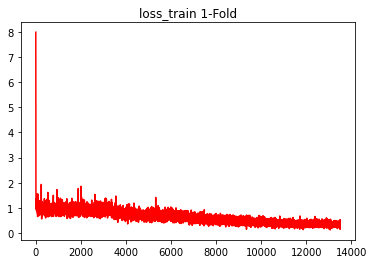

In [ ]:
# Each dot in the graph was recorded each 20 batch train iterations

plt.figure()

plt.subplot(1, 1, 1)
plt.title("loss_train 1-Fold")
plt.plot(np.array(resnet_rcnn_checkpoint['convergence']), 'r')

plt.show()

Training Faster RCNN with ResNet backbone 2/5-fold

In [ ]:
train(resnet_rcnn, resnet_lr_scheduler, resnet_radam, wheat_trainloader_2f, device, RESNET_PATH2f, convergence_lst_resnet, num_epochs=num_epochs, from_epoch=from_epoch)

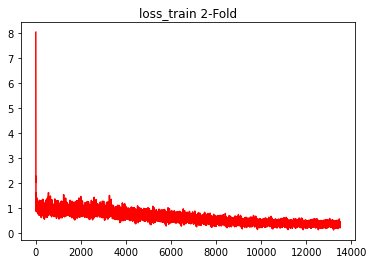

In [ ]:
# Each dot in the graph was recorded each 20 batch train iterations

plt.figure()

plt.subplot(1, 1, 1)
plt.title("loss_train 2-Fold")
plt.plot(np.array(resnet_rcnn_checkpoint['convergence']), 'r')

plt.show()

Training Faster RCNN with ResNet backbone 3/5-fold

In [ ]:
train(resnet_rcnn, resnet_lr_scheduler, resnet_radam, wheat_trainloader_3f, device, RESNET_PATH3f, convergence_lst_resnet, num_epochs=num_epochs, from_epoch=from_epoch)

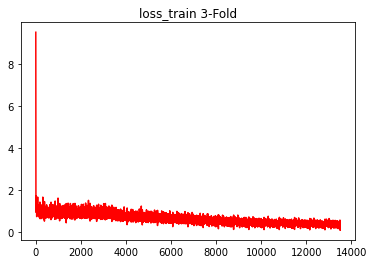

In [ ]:
# Each dot in the graph was recorded each 20 batch train iterations

plt.figure()

plt.subplot(1, 1, 1)
plt.title("loss_train 3-Fold")
plt.plot(np.array(resnet_rcnn_checkpoint['convergence']), 'r')

plt.show()

Training Faster RCNN with ResNet backbone 4/5-fold

In [ ]:
train(resnet_rcnn, resnet_lr_scheduler, resnet_radam, wheat_trainloader_4f, device, RESNET_PATH4f, convergence_lst_resnet, num_epochs=num_epochs, from_epoch=from_epoch)

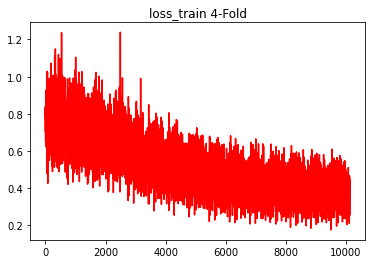

In [ ]:
# Each dot in the graph was recorded each 20 batch train iterations

plt.figure()

plt.subplot(1, 1, 1)
plt.title("loss_train 4-Fold")
plt.plot(np.array(resnet_rcnn_checkpoint['convergence']), 'r')

plt.show()

Training Faster RCNN with ResNet backbone 5/5-fold

In [ ]:
train(resnet_rcnn, resnet_lr_scheduler, resnet_radam, wheat_trainloader_5f, device, RESNET_PATH5f, convergence_lst_resnet, num_epochs=num_epochs, from_epoch=from_epoch)

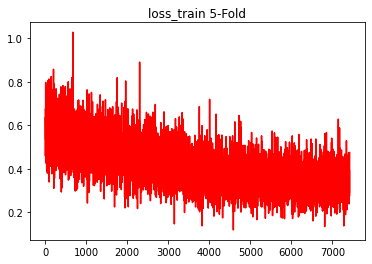

In [ ]:
# Each dot in the graph was recorded each 20 batch train iterations

plt.figure()

plt.subplot(1, 1, 1)
plt.title("loss_train 5-Fold")
plt.plot(np.array(resnet_rcnn_checkpoint['convergence']), 'r')

plt.show()

Defining new training parameters for Vgg RCNN

In [ ]:
# Optimizer
vgg_radam = RAdam(vgg_rcnn.parameters())

In [ ]:
# Scheduler
vgg_lr_scheduler = torch.optim.lr_scheduler.StepLR(vgg_radam, step_size=5, gamma=0.2)

In [ ]:
# A list, used to record the loss of the model on each batch of images
convergence_lst_vgg = list()

In [ ]:
# Defining the range of epochs for training
from_epoch = 0
num_epochs = 22

Loading Vgg Faster RCNN from an existing checkpoint (if needed)

In [ ]:
# Loading the checkpoint
vgg_rcnn_checkpoint = torch.load(VGG_PATH1f, map_location=device)

In [ ]:
# Loading the model state dict
vgg_rcnn.load_state_dict(vgg_rcnn_checkpoint['model'])

In [ ]:
# Loading checkpoint's epoch number
from_epoch = vgg_rcnn_checkpoint['epoch']

In [ ]:
# Loading checkpoint's optimizer
vgg_radam_dict = vgg_rcnn_checkpoint['optimizer']
vgg_radam.load_state_dict(vgg_radam_dict)

In [ ]:
# Loading checkpoint's scheduler
vgg_lr_scheduler_dict = vgg_rcnn_checkpoint['scheduler']
vgg_lr_scheduler.load_state_dict(vgg_lr_scheduler_dict)

Training Faster RCNN with Vgg backbone 1/5-fold

In [ ]:
train(vgg_rcnn, vgg_lr_scheduler, vgg_radam, wheat_trainloader_1f, device, VGG_PATH1f, convergence_lst_vgg, num_epochs=num_epochs, from_epoch=from_epoch)

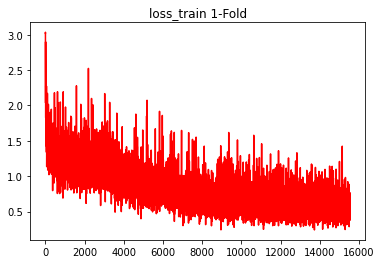

In [ ]:
# Each dot in the graph was recorded each 20 batch train iterations

plt.figure()

plt.subplot(1, 1, 1)
plt.title("loss_train 1-Fold")
plt.plot(np.array(vgg_rcnn_checkpoint['convergence']), 'r')

plt.show()

Training Faster RCNN with Vgg backbone 2/5-fold

In [ ]:
train(vgg_rcnn, vgg_lr_scheduler, vgg_radam, wheat_trainloader_2f, device, VGG_PATH2f, convergence_lst_vgg, num_epochs=num_epochs, from_epoch=from_epoch)

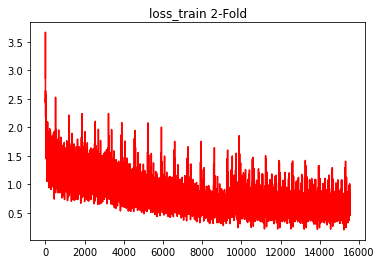

In [ ]:
# Each dot in the graph was recorded each 20 batch train iterations

plt.figure()

plt.subplot(1, 1, 1)
plt.title("loss_train 2-Fold")
plt.plot(np.array(vgg_rcnn_checkpoint['convergence']), 'r')

plt.show()

Training Faster RCNN with Vgg backbone 3/5-fold

In [ ]:
train(vgg_rcnn, vgg_lr_scheduler, vgg_radam, wheat_trainloader_3f, device, VGG_PATH3f, convergence_lst_vgg, num_epochs=num_epochs, from_epoch=from_epoch)

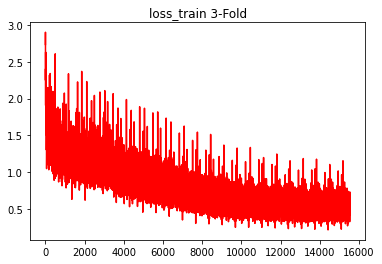

In [ ]:
# Each dot in the graph was recorded each 20 batch train iterations

plt.figure()

plt.subplot(1, 1, 1)
plt.title("loss_train 3-Fold")
plt.plot(np.array(vgg_rcnn_checkpoint['convergence']), 'r')

plt.show()

Training Faster RCNN with Vgg backbone 4/5-fold

In [ ]:
train(vgg_rcnn, vgg_lr_scheduler, vgg_radam, wheat_trainloader_4f, device, VGG_PATH4f, convergence_lst_vgg, num_epochs=num_epochs, from_epoch=from_epoch)

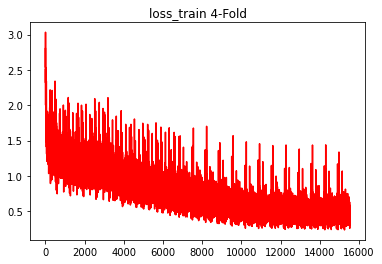

In [ ]:
# Each dot in the graph was recorded each 20 batch train iterations

plt.figure()

plt.subplot(1, 1, 1)
plt.title("loss_train 4-Fold")
plt.plot(np.array(vgg_rcnn_checkpoint['convergence']), 'r')

plt.show()

Training Faster RCNN with Vgg backbone 5/5-fold

In [ ]:
train(vgg_rcnn, vgg_lr_scheduler, vgg_radam, wheat_trainloader_5f, device, VGG_PATH5f, convergence_lst_vgg, num_epochs=num_epochs, from_epoch=from_epoch)

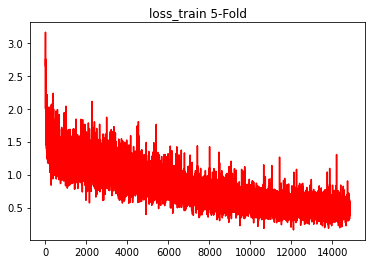

In [ ]:
# Each dot in the graph was recorded each 20 batch train iterations

plt.figure()

plt.subplot(1, 1, 1)
plt.title("loss_train 5-Fold")
plt.plot(np.array(vgg_rcnn_checkpoint['convergence']), 'r')

plt.show()

**Evaluating Faster RCNNs**

Loading the models for evaluation

1/5 - Fold - ResNet Faster RCNN

In [ ]:
resnet_rcnn_1f = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=False, pretrained_backbone=False)

# Changing out_features of model according our number of classes
resnet_rcnn_1f.roi_heads.box_predictor.cls_score.out_features = NUM_CLASSES
resnet_rcnn_1f.roi_heads.box_predictor.bbox_pred.out_features = NUM_CLASSES * 4

resnet_rcnn_1f.to(device)

# Loading the model from the checkpoint
resnet_rcnn_checkpoint = torch.load(RESNET_PATH1f, map_location=device)

# Loading the model state dict
resnet_rcnn_1f.load_state_dict(resnet_rcnn_checkpoint['model'])

<All keys matched successfully>

2/5 - Fold - ResNet Faster RCNN

In [ ]:
resnet_rcnn_2f = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=False, pretrained_backbone=False)

# Changing out_features of model according our number of classes
resnet_rcnn_2f.roi_heads.box_predictor.cls_score.out_features = NUM_CLASSES
resnet_rcnn_2f.roi_heads.box_predictor.bbox_pred.out_features = NUM_CLASSES * 4

resnet_rcnn_2f.to(device)

# Loading the model from the checkpoint
resnet_rcnn_checkpoint = torch.load(RESNET_PATH2f, map_location=device)

# Loading the model state dict
resnet_rcnn_2f.load_state_dict(resnet_rcnn_checkpoint['model'])

<All keys matched successfully>

3/5 - Fold - ResNet Faster RCNN

In [ ]:
resnet_rcnn_3f = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=False, pretrained_backbone=False)

# Changing out_features of model according our number of classes
resnet_rcnn_3f.roi_heads.box_predictor.cls_score.out_features = NUM_CLASSES
resnet_rcnn_3f.roi_heads.box_predictor.bbox_pred.out_features = NUM_CLASSES * 4

resnet_rcnn_3f.to(device)

# Loading the model from the checkpoint
resnet_rcnn_checkpoint = torch.load(RESNET_PATH3f, map_location=device)

# Loading the model state dict
resnet_rcnn_3f.load_state_dict(resnet_rcnn_checkpoint['model'])

<All keys matched successfully>

4/5 - Fold - ResNet Faster RCNN

In [ ]:
resnet_rcnn_4f = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=False, pretrained_backbone=False)

# Changing out_features of model according our number of classes
resnet_rcnn_4f.roi_heads.box_predictor.cls_score.out_features = NUM_CLASSES
resnet_rcnn_4f.roi_heads.box_predictor.bbox_pred.out_features = NUM_CLASSES * 4

resnet_rcnn_4f.to(device)

# Loading the model from the checkpoint
resnet_rcnn_checkpoint = torch.load(RESNET_PATH4f, map_location=device)

# Loading the model state dict
resnet_rcnn_4f.load_state_dict(resnet_rcnn_checkpoint['model'])

<All keys matched successfully>

5/5 - Fold - ResNet Faster RCNN

In [ ]:
resnet_rcnn_5f = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=False, pretrained_backbone=False)

# Changing out_features of model according our number of classes
resnet_rcnn_5f.roi_heads.box_predictor.cls_score.out_features = NUM_CLASSES
resnet_rcnn_5f.roi_heads.box_predictor.bbox_pred.out_features = NUM_CLASSES * 4

resnet_rcnn_5f.to(device)

# Loading the checkpoint
resnet_rcnn_checkpoint = torch.load(RESNET_PATH5f, map_location=device)

# Loading the model state dict
resnet_rcnn_5f.load_state_dict(resnet_rcnn_checkpoint['model'])

<All keys matched successfully>

1/5 - Fold - Vgg Faster RCNN

In [ ]:
vgg = models.vgg16(pretrained=False)

# Without the last maxpool layer
vgg_backbone = vgg.features[:-1]

# FasterRCNN needs to know the number of output channels in a backbone.
vgg_backbone.out_channels = 512

vgg_box_head = BoxHead(vgg)

vgg_rcnn_1f = torchvision.models.detection.faster_rcnn.FasterRCNN(
    vgg_backbone,
    rpn_anchor_generator = anchor_generator,
    box_roi_pool = roi_pooler,
    box_head = vgg_box_head,
    box_predictor = torchvision.models.detection.faster_rcnn.FastRCNNPredictor(4096, num_classes=NUM_CLASSES))

# Changing out_features of model according to our number of classes
vgg_rcnn_1f.roi_heads.box_predictor.cls_score.out_features = NUM_CLASSES
vgg_rcnn_1f.roi_heads.box_predictor.bbox_pred.out_features = NUM_CLASSES * 4

vgg_rcnn_1f.to(device)

# Loading the checkpoint
vgg_rcnn_checkpoint = torch.load(VGG_PATH1f, map_location="cpu")

# Loading the model state dict
vgg_rcnn_1f.load_state_dict(vgg_rcnn_checkpoint['model'])

<All keys matched successfully>

2/5 - Fold - Vgg Faster RCNN

In [ ]:
vgg = models.vgg16(pretrained=False)

# Without the last maxpool layer
vgg_backbone = vgg.features[:-1]

# FasterRCNN needs to know the number of output channels in a backbone.
vgg_backbone.out_channels = 512

vgg_box_head = BoxHead(vgg)

vgg_rcnn_2f = torchvision.models.detection.faster_rcnn.FasterRCNN(
    vgg_backbone,
    rpn_anchor_generator = anchor_generator,
    box_roi_pool = roi_pooler,
    box_head = vgg_box_head,
    box_predictor = torchvision.models.detection.faster_rcnn.FastRCNNPredictor(4096, num_classes=NUM_CLASSES))

# Changing out_features of model according to our number of classes
vgg_rcnn_2f.roi_heads.box_predictor.cls_score.out_features = NUM_CLASSES
vgg_rcnn_2f.roi_heads.box_predictor.bbox_pred.out_features = NUM_CLASSES * 4

vgg_rcnn_2f.to(device)

# Loading the checkpoint
vgg_rcnn_checkpoint = torch.load(VGG_PATH2f, map_location=device)

# Loading the model state dict
vgg_rcnn_2f.load_state_dict(vgg_rcnn_checkpoint['model'])

3/5 - Fold - Vgg Faster RCNN

In [ ]:
vgg = models.vgg16(pretrained=False)

# Without the last maxpool layer
vgg_backbone = vgg.features[:-1]

# FasterRCNN needs to know the number of output channels in a backbone.
vgg_backbone.out_channels = 512

vgg_box_head = BoxHead(vgg)

vgg_rcnn_3f = torchvision.models.detection.faster_rcnn.FasterRCNN(
    vgg_backbone,
    rpn_anchor_generator = anchor_generator,
    box_roi_pool = roi_pooler,
    box_head = vgg_box_head,
    box_predictor = torchvision.models.detection.faster_rcnn.FastRCNNPredictor(4096, num_classes=NUM_CLASSES))

# Changing out_features of model according to our number of classes
vgg_rcnn_3f.roi_heads.box_predictor.cls_score.out_features = NUM_CLASSES
vgg_rcnn_3f.roi_heads.box_predictor.bbox_pred.out_features = NUM_CLASSES * 4

vgg_rcnn_3f.to(device)

# Loading the checkpoint
vgg_rcnn_checkpoint = torch.load(VGG_PATH3f, map_location=device)

# Loading the model state dict
vgg_rcnn_3f.load_state_dict(vgg_rcnn_checkpoint['model'])

4/5 - Fold - Vgg Faster RCNN

In [ ]:
vgg = models.vgg16(pretrained=False)

# Without the last maxpool layer
vgg_backbone = vgg.features[:-1]

# FasterRCNN needs to know the number of output channels in a backbone.
vgg_backbone.out_channels = 512

vgg_box_head = BoxHead(vgg)

vgg_rcnn_4f = torchvision.models.detection.faster_rcnn.FasterRCNN(
    vgg_backbone,
    rpn_anchor_generator = anchor_generator,
    box_roi_pool = roi_pooler,
    box_head = vgg_box_head,
    box_predictor = torchvision.models.detection.faster_rcnn.FastRCNNPredictor(4096, num_classes=NUM_CLASSES))

# Changing out_features of model according to our number of classes
vgg_rcnn_4f.roi_heads.box_predictor.cls_score.out_features = NUM_CLASSES
vgg_rcnn_4f.roi_heads.box_predictor.bbox_pred.out_features = NUM_CLASSES * 4

vgg_rcnn_4f.to(device)

# Loading the checkpoint
vgg_rcnn_checkpoint = torch.load(VGG_PATH4f, map_location=device)

# Loading the model state dict
vgg_rcnn_4f.load_state_dict(vgg_rcnn_checkpoint['model'])

5/5 - Fold - Vgg Faster RCNN

In [ ]:
vgg = models.vgg16(pretrained=False)

# Without the last maxpool layer
vgg_backbone = vgg.features[:-1]

# FasterRCNN needs to know the number of output channels in a backbone.
vgg_backbone.out_channels = 512

vgg_box_head = BoxHead(vgg)

vgg_rcnn_5f = torchvision.models.detection.faster_rcnn.FasterRCNN(
    vgg_backbone,
    rpn_anchor_generator = anchor_generator,
    box_roi_pool = roi_pooler,
    box_head = vgg_box_head,
    box_predictor = torchvision.models.detection.faster_rcnn.FastRCNNPredictor(4096, num_classes=NUM_CLASSES))

# Changing out_features of model according to our number of classes
vgg_rcnn_5f.roi_heads.box_predictor.cls_score.out_features = NUM_CLASSES
vgg_rcnn_5f.roi_heads.box_predictor.bbox_pred.out_features = NUM_CLASSES * 4

vgg_rcnn_5f.to(device)

# Loading the checkpoint
vgg_rcnn_checkpoint = torch.load(VGG_PATH5f, map_location=device)

# Loading the model state dict
vgg_rcnn_5f.load_state_dict(vgg_rcnn_checkpoint['model'])

Writing each F-Measure corresponding with each Faster RCNN model into a text file

In [ ]:
resnet_rcnn_1f.eval()
resnet_rcnn_2f.eval()
resnet_rcnn_3f.eval()
resnet_rcnn_4f.eval()
resnet_rcnn_5f.eval()

vgg_rcnn_1f.eval()
vgg_rcnn_2f.eval()
vgg_rcnn_3f.eval()
vgg_rcnn_4f.eval()
vgg_rcnn_5f.eval()

rcnns = [resnet_rcnn_1f, resnet_rcnn_2f, resnet_rcnn_3f, resnet_rcnn_4f, resnet_rcnn_5f, 
         vgg_rcnn_1f, vgg_rcnn_2f, vgg_rcnn_3f, vgg_rcnn_4f, vgg_rcnn_5f]

valloaders = [wheat_valloader_1f, wheat_valloader_2f, wheat_valloader_3f, wheat_valloader_4f, wheat_valloader_5f, 
              wheat_valloader_1f, wheat_valloader_2f, wheat_valloader_3f, wheat_valloader_4f, wheat_valloader_5f]

metrics = write_evaluations_to_file(rcnns, valloaders, F_MEASURES_PATH_FR, device=device)

Printing metrics

In [ ]:
print(f'Model name: resnet_rcnn_1f --> F-Measure = {metrics[0][0]}\nTP: {metrics[0][1]}\tFP: {metrics[0][2]}\tFN: {metrics[0][3]}')

Model name: resnet_rcnn_1f --> F-Measure = 0.7481184147141274
TP: 24190	FP: 8006	FN: 3199


In [ ]:
print(f'Model name: resnet_rcnn_2f --> F-Measure = {metrics[1][0]}\nTP: {metrics[1][1]}\tFP: {metrics[1][2]}\tFN: {metrics[1][3]}')

Model name: resnet_rcnn_2f --> F-Measure = 0.7399988180836242
TP: 24263	FP: 8783	FN: 3574


In [ ]:
print(f'Model name: resnet_rcnn_3f --> F-Measure = {metrics[2][0]}\nTP: {metrics[2][1]}\tFP: {metrics[2][2]}\tFN: {metrics[2][3]}')

Model name: resnet_rcnn_3f --> F-Measure = 0.742714133152372
TP: 24007	FP: 8158	FN: 3305


In [ ]:
print(f'Model name: resnet_rcnn_4f --> F-Measure = {metrics[3][0]}\nTP: {metrics[3][1]}\tFP: {metrics[3][2]}\tFN: {metrics[3][3]}')

Model name: resnet_rcnn_4f --> F-Measure = 0.7386827639921073
TP: 26072	FP: 9412	FN: 3551


In [ ]:
print(f'Model name: resnet_rcnn_5f --> F-Measure = {metrics[4][0]}\nTP: {metrics[4][1]}\tFP: {metrics[4][2]}\tFN: {metrics[4][3]}')

Model name: resnet_rcnn_5f --> F-Measure = 0.7579017599413755
TP: 25072	FP: 7718	FN: 3133


In [ ]:
print(f'Model name: vgg_rcnn_1f --> F-Measure = {metrics[5][0]}\nTP: {metrics[5][1]}\tFP: {metrics[5][2]}\tFN: {metrics[5][3]}')

Model name: vgg_rcnn_1f --> F-Measure = 0.8193062760334321
TP: 24644	FP: 5563	FN: 2745


In [ ]:
print(f'Model name: vgg_rcnn_2f --> F-Measure = {metrics[6][0]}\nTP: {metrics[6][1]}\tFP: {metrics[6][2]}\tFN: {metrics[6][3]}')

Model name: vgg_rcnn_2f --> F-Measure = 0.8093467121047444
TP: 24990	FP: 6044	FN: 2847


In [ ]:
print(f'Model name: vgg_rcnn_3f --> F-Measure = {metrics[7][0]}\nTP: {metrics[7][1]}\tFP: {metrics[7][2]}\tFN: {metrics[7][3]}')

Model name: vgg_rcnn_3f --> F-Measure = 0.8083876060846027
TP: 23900	FP: 5632	FN: 3412


In [ ]:
print(f'Model name: vgg_rcnn_4f --> F-Measure = {metrics[8][0]}\nTP: {metrics[8][1]}\tFP: {metrics[8][2]}\tFN: {metrics[8][3]}')

Model name: vgg_rcnn_4f --> F-Measure = 0.818681879234461
TP: 26015	FP: 5725	FN: 3608


In [ ]:
print(f'Model name: vgg_rcnn_5f --> F-Measure = {metrics[9][0]}\nTP: {metrics[9][1]}\tFP: {metrics[9][2]}\tFN: {metrics[9][3]}')

Model name: vgg_rcnn_5f --> F-Measure = 0.8251658966342615
TP: 24896	FP: 5331	FN: 3309


# **YoloV5**

In [ ]:
%cd yolov5

YOLOv5 was trained for three times, the training was resumed for two times

In [ ]:
!python train.py --img 1024 --batch 8 --epochs 80 --data ./data/yolov5x-wheat-dataset.yaml --cfg ./models/yolov5x.yaml --weights '' --name yolov5x_wheat

In [ ]:
!python train.py --img 1024 --batch 8 --epochs 80 --data ./data/yolov5x-wheat-dataset.yaml --cfg ./models/yolov5x.yaml --weights last.pt --name yolov5x_wheat --resume

In [ ]:
# Resuming the training with a greater number of epochs than before,
# to let the model return to the last results before trying to improve it
!python train.py --img 1024 --batch 8 --epochs 95 --data ./data/yolov5x-wheat-dataset.yaml --cfg ./models/yolov5x.yaml --weights last.pt --name yolov5x_wheat --resume

In [ ]:
# Saving the model directory
!zip "/content/gdrive/My Drive/models/yolov5.zip" "/content/yolov5"

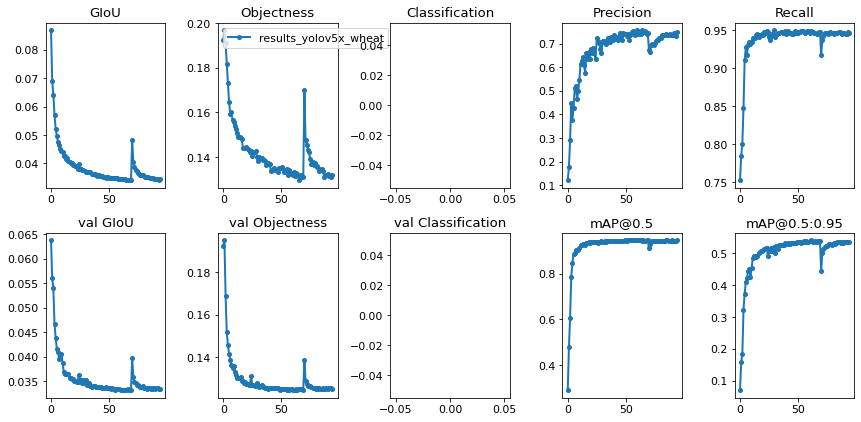

In [ ]:
from utils.utils import plot_results
plot_results()

In [ ]:
!unzip "/content/gdrive/My Drive/yolov5.zip" -d "./"

In [ ]:
def makePseudolabel(weights = '/content/weights/best_yolov5x_wheat.pt', source = f'{ORIGIN_WHEAT_PATH}/test', imgsz=SRC_IMG_SIZE, conf_thres=0.5, iou_thres=0.5):
    # Creates new yolov5 pseudo dataset:
    # train: the labels are the predictions of the pretrained yolov5 model on the test set and the images are the original test images
    # val: the labels and the images are taken from the original validation set
    # weights are the weights of the pretrained model and source is the path of the original test images

    is_TTA = True
    imagenames =  os.listdir(source)
    device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

    # Load model
    model = torch.load(weights, map_location=device)['model'].float()  # load to FP32
    model.to(device).eval()
    
    dataset = LoadImages(source, img_size=imgsz)

    if not os.path.exists('convertor/labels/train'):
        os.makedirs('convertor/labels/train')
    if not os.path.exists('convertor/labels/val'):
        os.makedirs('convertor/labels/val')
    if not os.path.exists('convertor/images/train'):
        os.makedirs('convertor/images/train')
    if not os.path.exists('convertor/images/val'):
        os.makedirs('convertor/images/val')

    # train        
    for name in tqdm(imagenames):
        image_id = name.split('.')[0]
        im01 = cv2.imread('%s/%s.jpg'%(source,image_id))  # BGR
        if im01.shape[0]!=1024 or im01.shape[1]!=1024:
            continue
        assert im01 is not None, 'Image Not Found'

        # Padded resize
        im_w, im_h = im01.shape[:2]
        if is_TTA:
            enboxes = []
            enscores = []
            for i in range(4):
                im0 = TTAImage(im01, i)
                boxes, scores = detect1Image(im0, imgsz, model, device, conf_thres, iou_thres)
                for _ in range(3-i):
                    boxes = rotBoxes90(boxes, im_w, im_h)
                    
                enboxes.append(boxes)
                enscores.append(scores) 

            boxes, scores, labels = run_wbf(enboxes, enscores, image_size = im_w, iou_thr=0.6, skip_box_thr=0.43)
            boxes = boxes.astype(np.int32).clip(min=0, max=im_w)
        else:
            boxes, scores = detect1Image(im01, imgsz, model, device, conf_thres, iou_thres)

        boxes[:, 2] = boxes[:, 2] - boxes[:, 0]
        boxes[:, 3] = boxes[:, 3] - boxes[:, 1]
        
        boxes = boxes[scores >= 0.1].astype(np.int32)
        scores = scores[scores >=float(0.1)]
        
        lineo = ''
        for box in boxes:
            x1, y1, w, h = box
            xc, yc, w, h = (x1+w/2)/1024, (y1+h/2)/1024, w/1024, h/1024
            lineo += '0 %f %f %f %f\n'%(xc, yc, w, h)
            
        fileo = open(f'/content/convertor/labels/train/{image_id}.txt', 'w+')
        fileo.write(lineo)
        fileo.close()
        sh.copy("{}/{}.jpg".format(source, image_id),'/content/convertor/images/train/{}.jpg'.format(image_id))

    val_images_paths = glob.glob(f'{DARKNET_DS_PATH}/images/val/*.jpg')[:5]
    val_txt_paths = glob.glob(f'{DARKNET_DS_PATH}/labels/val/*.txt')[:5]

    # val
    for p1, p2 in zip(val_images_paths, val_txt_paths):
        img_str_id = p1[p1.rfind('/') + 1 : p1.rfind('.')]
        sh.copy(p1,'/content/convertor/images/val/{}.jpg'.format(img_str_id))
        sh.copy(p2,'/content/convertor/labels/val/{}.txt'.format(img_str_id))

In [ ]:
makePseudolabel()

In [ ]:
!cp "/content/gdrive/My Drive/yolov5/weights/best_yolo5x_wheat.pt" "/content/yolov5/weights"

In [ ]:
%cd /content/yolov5

In [ ]:
!python train.py --img 1024 --batch 4 --epochs 107 --data ./data/yolov5x-wheat-dataset.yaml --cfg ./models/yolov5x.yaml --weights ./weights/best_yolov5x_wheat.pt

Loading YOLOv5 model for evaluating and testing

In [ ]:
%cd /content/

In [ ]:
# Loading YOLOv5
yolov5 = torch.load(YOLO_PATH, map_location=device)['model'].float()
yolov5.to(device).eval();

In [ ]:
f_measure, tp, fp, fn = evaluate_yolo(wheat_valloader_1f1024, yolov5, device=device)

In [ ]:
print(f'Model name: detectron2_1f --> F-Measure = {f_measure}\nTP: {tp}\tFP: {fp}\tFN: {fn}')

Model name: detectron2_1f --> F-Measure = 0.9479303936475436
TP: 28054	FP: 1541	FN: 1813


# **Detectron2**

In [ ]:
def create_wheat_dicts_for_detectron(dataset_path, k_pos, k=5, dest_type="rgb", transforms=None, process="train"):
    # Creates a wheat custom dataset for detectron2 models
    # dataset_path --> a path to an existing dataset of the global-wheat-detection
    # k, k_pos --> to determine the train/validation division of this dataset by k-fold cross validation
    # dest_type --> the requested type for images in the new dataset (rgb, bgr, grey)

    ds = WheatDataset(dataset_path, dest_type, transform=transforms, divide=True, preprocessing=True, k=5, k_pos=k_pos, process=process)
    dl = DataLoader(ds, batch_size=TEST_BATCH_SIZE, shuffle=False, num_workers=8, collate_fn=collate_fn)

    dataset_dicts = list()
    for images, targets, image_ids in tqdm(dl): # batch size = 1
        record = dict()
        record["file_name"] = f'{dataset_path}/{process}/{image_ids[0]}.jpg'
        record["image_id"] = targets[0]['image_id']
        record["height"] = images[0].shape[1]
        record["width"] = images[0].shape[2]

        annotations = list()
        for box in targets[0]['boxes']:
            xmin = box[0].item()
            ymin = box[1].item()
            xmax = box[2].item()
            ymax = box[3].item()

            poly = [
                (xmin, ymin), (xmax, ymin), 
                (xmax, ymax), (xmin, ymax)
            ]
            poly = list(itertools.chain.from_iterable(poly))

            anno = {
              "bbox": [xmin, ymin, xmax, ymax],
              "bbox_mode": BoxMode.XYXY_ABS,
              "segmentation": [poly],
              "category_id": 0, # Wheat
              "iscrowd": 0
            }
            annotations.append(anno)

        record["annotations"] = annotations
        dataset_dicts.append(record)
        
    return dataset_dicts

Registering the data (1/5-fold) into the dataset and metadata catalogs

In [ ]:
for p in tqdm(["train", "val"]):
    DatasetCatalog.register("wheat1f_" + p, lambda p=p: create_wheat_dicts_for_detectron(ORIGIN_WHEAT_PATH, k_pos=0, process=p))
    MetadataCatalog.get("wheat1f_" + p).set(thing_classes=['Wheat'])

statement_metadata = MetadataCatalog.get("wheat1f_train")

Registering the data (2/5-fold) into the dataset and metadata catalogs

In [ ]:
for p in tqdm(["train", "val"]):
    DatasetCatalog.register("wheat2f_" + p, lambda p=p: create_wheat_dicts_for_detectron(ORIGIN_WHEAT_PATH, k_pos=1, process=p))
    MetadataCatalog.get("wheat2f_" + p).set(thing_classes=['Wheat'])

statement_metadata = MetadataCatalog.get("wheat2f_train")

Registering the data (3/5-fold) into the dataset and metadata catalogs

In [ ]:
for p in tqdm(["train", "val"]):
    DatasetCatalog.register("wheat3f_" + p, lambda p=p: create_wheat_dicts_for_detectron(ORIGIN_WHEAT_PATH, k_pos=2, process=p))
    MetadataCatalog.get("wheat3f_" + p).set(thing_classes=['Wheat'])

statement_metadata = MetadataCatalog.get("wheat3f_train")

Registering the data (4/5-fold) into the dataset and metadata catalogs

In [ ]:
for p in tqdm(["train", "val"]):
    DatasetCatalog.register("wheat4f_" + p, lambda p=p: create_wheat_dicts_for_detectron(ORIGIN_WHEAT_PATH, k_pos=3, process=p))
    MetadataCatalog.get("wheat4f_" + p).set(thing_classes=['Wheat'])

statement_metadata = MetadataCatalog.get("wheat4f_train")

Registering the data (5/5-fold) into the dataset and metadata catalogs

In [ ]:
for p in tqdm(["train", "val"]):
    DatasetCatalog.register("wheat5f_" + p, lambda p=p: create_wheat_dicts_for_detectron(ORIGIN_WHEAT_PATH, k_pos=4, process=p))
    MetadataCatalog.get("wheat5f_" + p).set(thing_classes=['Wheat'])

statement_metadata = MetadataCatalog.get("wheat5f_train")

Loading the config file and the pre-trained model weights

In [ ]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/retinanet_R_101_FPN_3x.yaml"))
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/retinanet_R_101_FPN_3x.yaml")

Defining some properties for the config file

In [ ]:
cfg.DATASETS.TRAIN = ("wheat_train",)
cfg.DATASETS.TEST = ("wheat_val",)
cfg.DATALOADER.NUM_WORKERS = 8

cfg.SOLVER.IMS_PER_BATCH = 2

# Scheduler
cfg.SOLVER.BASE_LR = 0.0005
cfg.SOLVER.WARMUP_ITERS = 1000
cfg.SOLVER.MAX_ITER = 15000
cfg.SOLVER.STEPS = (10000, 15000)
cfg.SOLVER.GAMMA = 0.5

cfg.MODEL.RETINANET.NUM_CLASSES = 1 # Wheat
cfg.MODEL.RETINANET.FOCAL_LOSS_ALPHA = 0.5
cfg.MODEL.RETINANET.FOCAL_LOSS_GAMMA = 5
cfg.MODEL.RETINANET.SMOOTH_L1_LOSS_BETA = 2

cfg.DATALOADER.FILTER_EMPTY_ANNOTATIONS = False # Also learn from images with no wheat bounding boxes
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
cfg.TEST.EVAL_PERIOD = 1000

Defining the checkpoint path of detectron2 using the 1/5-fold partition

In [ ]:
cfg.OUTPUT_DIR = DETECTRON_CFG_PATH_1f

Defining the checkpoint path of detectron2 using the 2/5-fold partition

In [ ]:
cfg.OUTPUT_DIR = DETECTRON_CFG_PATH_2f

Defining the checkpoint path of detectron2 using the 3/5-fold partition

In [ ]:
cfg.OUTPUT_DIR = DETECTRON_CFG_PATH_3f

Defining the checkpoint path of detectron2 using the 4/5-fold partition

In [ ]:
cfg.OUTPUT_DIR = DETECTRON_CFG_PATH_4f

Defining the checkpoint path of detectron2 using the 5/5-fold partition

In [ ]:
cfg.OUTPUT_DIR = DETECTRON_CFG_PATH_5f

Defining a new train loader to add detectron2 augmentations

In [ ]:
dataloader = build_detection_train_loader(cfg,
   mapper=DatasetMapper(cfg, is_train=True, augmentations=[
      DT.Resize((800, 800), DT.RandomFlip()),
      DT.RandomApply(DT.RotationTransform(800, 800, 180)),
      DT.RandomApply(DT.HFlipTransform(800)),
      DT.RandomApply(DT.VFlipTransform(800)),
      DT.RandomBrightness(0.1, 1.6),
      DT.RandomContrast(0.1, 1.6),
      DT.RandomSaturation(0.1, 1.6)
   ]))

Training Detectron2

In [ ]:
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

Evaluating the Detectron2 models

1/5 - fold Detectron2

In [ ]:
cfg_1f = get_cfg()

# Gets the pretrained RetinaNet from the given path
cfg_1f.merge_from_file(model_zoo.get_config_file("COCO-Detection/retinanet_R_101_FPN_3x.yaml"))
cfg_1f.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/retinanet_R_101_FPN_3x.yaml")

# Sets number of classes to 1 (Wheat)
cfg_1f.MODEL.RETINANET.NUM_CLASSES = 1

# Allows images without bounding boxes
cfg_1f.DATALOADER.FILTER_EMPTY_ANNOTATIONS = False

# Sets the output directory of the current Detectron2 model
cfg_1f.OUTPUT_DIR = DETECTRON_CFG_PATH_1f

# Loading Detectron2 model
cfg_1f.MODEL.WEIGHTS = os.path.join(cfg_1f.OUTPUT_DIR, "model_final.pth")

# Detectron2 validation dataloader
val_loader_1f = build_detection_test_loader(cfg_1f, "wheat1f_val")

predictor_1f = DefaultPredictor(cfg_1f)

2/5 - fold Detectron2

In [ ]:
cfg_2f = get_cfg()

# Gets the pretrained RetinaNet from the given path
cfg_2f.merge_from_file(model_zoo.get_config_file("COCO-Detection/retinanet_R_101_FPN_3x.yaml"))
cfg_2f.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/retinanet_R_101_FPN_3x.yaml")

# Sets number of classes to 1 (Wheat)
cfg_2f.MODEL.RETINANET.NUM_CLASSES = 1

# Allows images without bounding boxes
cfg_2f.DATALOADER.FILTER_EMPTY_ANNOTATIONS = False

# Sets the output directory of the current Detectron2 model
cfg_2f.OUTPUT_DIR = DETECTRON_CFG_PATH_2f

# Loading Detectron2 model
cfg_2f.MODEL.WEIGHTS = os.path.join(cfg_2f.OUTPUT_DIR, "model_final.pth")

# Detectron2 validation dataloader
val_loader_2f = build_detection_test_loader(cfg_2f, "wheat2f_val")

predictor_2f = DefaultPredictor(cfg_2f)

3/5 - fold Detectron2

In [ ]:
cfg_3f = get_cfg()

# Gets the pretrained RetinaNet from the given path
cfg_3f.merge_from_file(model_zoo.get_config_file("COCO-Detection/retinanet_R_101_FPN_3x.yaml"))
cfg_3f.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/retinanet_R_101_FPN_3x.yaml")

# Sets number of classes to 1 (Wheat)
cfg_3f.MODEL.RETINANET.NUM_CLASSES = 1

# Allows images without bounding boxes
cfg_3f.DATALOADER.FILTER_EMPTY_ANNOTATIONS = False

# Sets the output directory of the current Detectron2 model
cfg_3f.OUTPUT_DIR = DETECTRON_CFG_PATH_3f

# Loading Detectron2 model
cfg_3f.MODEL.WEIGHTS = os.path.join(cfg_3f.OUTPUT_DIR, "model_final.pth")

# Detectron2 validation dataloader
val_loader_3f = build_detection_test_loader(cfg_3f, "wheat3f_val")

predictor_3f = DefaultPredictor(cfg_3f)

4/5 - fold Detectron2

In [ ]:
cfg_4f = get_cfg()

# Gets the pretrained RetinaNet from the given path
cfg_4f.merge_from_file(model_zoo.get_config_file("COCO-Detection/retinanet_R_101_FPN_3x.yaml"))
cfg_4f.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/retinanet_R_101_FPN_3x.yaml")

# Sets number of classes to 1 (Wheat)
cfg_4f.MODEL.RETINANET.NUM_CLASSES = 1

# Allows images without bounding boxes
cfg_4f.DATALOADER.FILTER_EMPTY_ANNOTATIONS = False

# Sets the output directory of the current Detectron2 model
cfg_4f.OUTPUT_DIR = DETECTRON_CFG_PATH_4f

# Loading Detectron2 model
cfg_4f.MODEL.WEIGHTS = os.path.join(cfg_4f.OUTPUT_DIR, "model_final.pth")

# Detectron2 validation dataloader
val_loader_4f = build_detection_test_loader(cfg_4f, "wheat4f_val")

predictor_4f = DefaultPredictor(cfg_4f)

5/5 - fold Detectron2

In [ ]:
cfg_5f = get_cfg()

# Gets the pretrained RetinaNet from the given path
cfg_5f.merge_from_file(model_zoo.get_config_file("COCO-Detection/retinanet_R_101_FPN_3x.yaml"))
cfg_5f.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/retinanet_R_101_FPN_3x.yaml")

# Sets number of classes to 1 (Wheat)
cfg_5f.MODEL.RETINANET.NUM_CLASSES = 1

# Allows images without bounding boxes
cfg_5f.DATALOADER.FILTER_EMPTY_ANNOTATIONS = False

# Sets the output directory of the current Detectron2 model
cfg_5f.OUTPUT_DIR = DETECTRON_CFG_PATH_5f

# Loading Detectron2 model
cfg_5f.MODEL.WEIGHTS = os.path.join(cfg_5f.OUTPUT_DIR, "model_final.pth")

# Detectron2 validation dataloader
val_loader_5f = build_detection_test_loader(cfg_5f, "wheat5f_val")

predictor_5f = DefaultPredictor(cfg_5f)

# cfg.MODEL.ANCHOR_GENERATOR.SIZES = [[16, 32, 64, 128, 256]] # [[32, 64, 128, 256, 512]]

In [ ]:
# Evaluating Detectron2 models and writing the results into a text file
detectrons = [predictor_1f, predictor_2f, predictor_3f, predictor_4f, predictor_5f]
valloaders = [wheat_valloader_1f1024, wheat_valloader_2f1024, wheat_valloader_3f1024, wheat_valloader_4f1024, wheat_valloader_5f1024]

metrics = write_evaluations_to_file(detectrons, valloaders, F_MEASURES_PATH_D2, True)

In [ ]:
print(f'Model name: detectron2_1f --> F-Measure = {metrics[0][0]}\nTP: {metrics[0][1]}\tFP: {metrics[0][2]}\tFN: {metrics[0][3]}')

Model name: detectron2_1f --> F-Measure = 0.7717736796949597
TP: 27112	FP: 6404	FN: 2755


In [ ]:
print(f'Model name: detectron2_2f --> F-Measure = {metrics[1][0]}\nTP: {metrics[1][1]}\tFP: {metrics[1][2]}\tFN: {metrics[1][3]}')

Model name: detectron2_2f --> F-Measure = 0.7623782753904061
TP: 25856	FP: 6586	FN: 2438


In [ ]:
print(f'Model name: detectron2_3f --> F-Measure = {metrics[2][0]}\nTP: {metrics[2][1]}\tFP: {metrics[2][2]}\tFN: {metrics[2][3]}')

Model name: detectron2_3f --> F-Measure = 0.7703415945140694
TP: 27231	FP: 6460	FN: 2618


In [ ]:
print(f'Model name: detectron2_4f --> F-Measure = {metrics[3][0]}\nTP: {metrics[3][1]}\tFP: {metrics[3][2]}\tFN: {metrics[3][3]}')

Model name: detectron2_4f --> F-Measure = 0.7822359181722032
TP: 26299	FP: 5907	FN: 2623


In [ ]:
print(f'Model name: detectron2_5f --> F-Measure = {metrics[4][0]}\nTP: {metrics[4][1]}\tFP: {metrics[4][2]}\tFN: {metrics[4][3]}')

Model name: detectron2_5f --> F-Measure = 0.7859146489867301
TP: 27908	FP: 6190	FN: 2953


# **Testing the models**

In [ ]:
def format_prediction_string(boxes, scores):
    # Returns the values of the given boxes and scores according to the submission prediction format
    
    pred_strings = []
    for j in zip(scores, boxes):
        pred_strings.append("{0:.4f} {1} {2} {3} {4}".format(j[0], j[1][0], j[1][1], j[1][2], j[1][3]))

    return " ".join(pred_strings)

In [ ]:
def test(model, testloader, score_thresh=0.4):
    # Given a Faster RCNN model, a test datasloader with batch size = 1, and a threshold for filtering bboxes by score value
    # Returns a list of dictionaries. Each dictionary includes the image ID,
    # the predicted image (contain rectangles for each bbox),
    # and a string includes the corresponding bbox and score predictions

    model.eval()
    test_ids, all_boxes, all_scores, results = list(), list(), list(), list()

    for images, image_ids in tqdm(testloader):
        img = torch.from_numpy(images[0] / images[0].shape[1]).permute(2, 0, 1).to(device).float()
        prediction = model([img])[0] # batch size = 1
        boxes = prediction['boxes'].detach().cpu().numpy()
        scores = prediction['scores'].detach().cpu().numpy()
        filtered_boxes, filtered_scores = list(), list()

        for b, p, in zip(boxes, scores):
            if p > score_thresh:
                filtered_boxes.append(b)
                filtered_scores.append(p)

        img_np = cv2.normalize(img.permute(1, 2, 0).to("cpu").numpy(), None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U)
        resized_img = cv2.resize(img_np, (SRC_IMG_SIZE, SRC_IMG_SIZE), cv2.INTER_LINEAR) # Resizing image to original size
        resized_boxes = np.asarray(np.asarray(filtered_boxes, dtype=np.float64) * (SRC_IMG_SIZE / DEST_IMG_SIZE1), dtype=np.int32).clip(min=0, max=1023) # Resizing boxes to original size
        scores_str = ['{0:.2f}'.format(s) for s in filtered_scores]
        resized_img = draw_bboxes(resized_img, resized_boxes, scores_str, 1.5, thickness=5) # Draws bboxes within the current image

        # Converting from Pascal_voc to Coco format
        resized_boxes[:, 2] = resized_boxes[:, 2] - resized_boxes[:, 0]
        resized_boxes[:, 3] = resized_boxes[:, 3] - resized_boxes[:, 1]
        
        result = {
            'image_id': image_ids[0],
            'PredictionString': format_prediction_string(resized_boxes, filtered_scores),
            'image': resized_img
        }
        results.append(result)
    
    return results

In [ ]:
def run_wbf(boxes, scores, image_size=1023, iou_thr=0.5, skip_box_thr=0.7, weights=None):
    labels = [np.zeros(score.shape[0]) for score in scores]
    boxes = [box/(image_size) for box in boxes]
    boxes, scores, labels = weighted_boxes_fusion(boxes, scores, labels, weights=None, iou_thr=iou_thr, skip_box_thr=skip_box_thr)
    boxes = boxes*(image_size)
    
    return boxes, scores, labels

TTA augmentations

In [ ]:
def TTAImage(image, index):
    # Rotates the given image by the given index, which determines the type of rotation

    image1 = image.copy()
    if index==0: 
        rotated_image = cv2.rotate(image1, cv2.ROTATE_90_CLOCKWISE)
        return rotated_image
    elif index==1:
        rotated_image2 = cv2.rotate(image1, cv2.ROTATE_90_CLOCKWISE)
        rotated_image2 = cv2.rotate(rotated_image2, cv2.ROTATE_90_CLOCKWISE)
        return rotated_image2
    elif index==2:
        rotated_image3 = cv2.rotate(image1, cv2.ROTATE_90_CLOCKWISE)
        rotated_image3 = cv2.rotate(rotated_image3, cv2.ROTATE_90_CLOCKWISE)
        rotated_image3 = cv2.rotate(rotated_image3, cv2.ROTATE_90_CLOCKWISE)
        return rotated_image3
    elif index == 3:
        return image1
    
def rotBoxes90(boxes, im_w, im_h):
    # Rotates the given bounding boxes 90 degrees, according to the given image shapes 
    
    ret_boxes =[]
    for box in boxes:
        x1, y1, x2, y2 = box
        x1, y1, x2, y2 = x1-im_w//2, im_h//2 - y1, x2-im_w//2, im_h//2 - y2
        x1, y1, x2, y2 = y1, -x1, y2, -x2
        x1, y1, x2, y2 = int(x1+im_w//2), int(im_h//2 - y1), int(x2+im_w//2), int(im_h//2 - y2)
        x1a, y1a, x2a, y2a = min(x1, x2), min(y1, y2), max(x1, x2), max(y1, y2)
        ret_boxes.append([x1a, y1a, x2a, y2a])
    return np.array(ret_boxes)

In [ ]:
def test_ensemble(faster_rcnns, detectrons2, yolov5, testloader, faster_rcnn_weights_path, detectron2_weights_path, score_thresh=[0.4, 0.4, 0.4, 0.4], iou_thresh=[0.4, 0.4, 0.4, 0.4]):
    # Given a detection ensemble of models (faster_rcnns, detectron2 models and a yolo), a test dataloader, a path to texts file which include f-measures of each model,
    # and iou/score threshold lists, for each model type: typei --> thresh(i). The thresholds of the whole ensemble is in the last indexes of these lists.
    # Returns a dictionary including the results of the given ensemble according to the submission format of the wheat competition

    results, fr_f_measures, d2_f_measures = list(), list(), list()

    # Reads each f-measure corresponding with each model (five versions (folds) of resnet, 
    # vgg Faster RCNNs or detectrons version 2), by the given path of a text file.
    # These F-Measures are the weights of the models in the ensemble
    with open(faster_rcnn_weights_path, 'r') as eval_file:
        line = eval_file.readline()
        while line:
            fr_f_measures.append(float(line))
            line = eval_file.readline()
    with open(detectron2_weights_path, 'r') as eval_file:
        line = eval_file.readline()
        while line:
            d2_f_measures.append(float(line))
            line = eval_file.readline()
    
    # Collects predictions of each model
    for images, image_ids in tqdm(testloader): # batch size = 1
        # img --> for the predictions of YOLOv5 and Detectron2 models
        img = images[0]
        
        # resized_img --> for the predictions of Faster RCNN models
        # Resizing and normalizing the image to match faster rcnn test predictions (trained on image size of 512 X 512 and range (0-1))
        resized_img = cv2.resize(img, (DEST_IMG_SIZE1, DEST_IMG_SIZE1), cv2.INTER_LINEAR) / DEST_IMG_SIZE1 # Resizing image to original size
        # cv2.normalize(img, None, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_32F)
        all_fr_boxes, all_fr_scores, all_fr_labels = list(), list(), list()
        all_d2_boxes, all_d2_scores, all_d2_labels = list(), list(), list()
        all_y_boxes, all_y_scores, all_y_labels = list(), list(), list()

        for fr in faster_rcnns:
            fr.eval()

            tta_fr_boxes, tta_fr_scores, tta_fr_labels = list(), list(), list()

            for i in range(4):
                resized_img_ = torch.from_numpy(TTAImage(resized_img, i)).permute(2, 0, 1).float().to(device) # (3, 512, 512), tensor, 0-1
                
                # Current Faster RCNN prediction using TTA
                fr_prediction = fr([resized_img_])[0] # batch size = 1
                fr_boxes = fr_prediction['boxes'].data.cpu().numpy()
                fr_scores = fr_prediction['scores'].data.cpu().numpy().tolist()

                for _ in range(3-i): # Reordering the boxes
                    fr_boxes = rotBoxes90(fr_boxes, resized_img_.shape[1], resized_img_.shape[1])

                tta_fr_boxes.append((fr_boxes / resized_img_.shape[1]).tolist())
                tta_fr_scores.append(fr_scores)
                tta_fr_labels.append([1] * len(fr_boxes))
                        
            tta_fr_boxes, tta_fr_scores, tta_fr_labels = weighted_boxes_fusion(tta_fr_boxes, tta_fr_scores, tta_fr_labels, weights=None, conf_type='avg', iou_thr=iou_thresh[0], skip_box_thr=score_thresh[0])
            all_fr_boxes.append(tta_fr_boxes)    
            all_fr_scores.append(tta_fr_scores)
            all_fr_labels.append(tta_fr_labels) # Wheat --> 1
            
        for d2 in detectrons2:         
            tta_d2_boxes, tta_d2_scores, tta_d2_labels = list(), list(), list()
            for i in range(4):
                img_ = TTAImage(img, i) # (1024, 1024, 3), numpy, 0-255
                        
                # Current Detectron2 prediction using TTA
                d2_prediction = d2(img_) # batch size = 1
                d2_boxes = d2_prediction['instances'].get_fields()['pred_boxes'].tensor.data.cpu().numpy()
                d2_scores = d2_prediction['instances'].get_fields()['scores'].data.cpu().numpy().tolist()

                for _ in range(3-i): # Reordering the boxes
                    d2_boxes = rotBoxes90(d2_boxes, img_.shape[1], img_.shape[1])
                
                tta_d2_boxes.append((d2_boxes / img_.shape[1]).tolist())
                tta_d2_scores.append(d2_scores)
                tta_d2_labels.append([1] * len(d2_boxes))
                        
            tta_d2_boxes, tta_d2_scores, tta_d2_labels = weighted_boxes_fusion(tta_d2_boxes, tta_d2_scores, tta_d2_labels, weights=None, conf_type='avg', iou_thr=iou_thresh[0], skip_box_thr=score_thresh[0])
            all_d2_boxes.append(tta_d2_boxes)    
            all_d2_scores.append(tta_d2_scores)
            all_d2_labels.append(tta_d2_labels) # Wheat --> 1
        
        for i in range(4):
            img_ = TTAImage(img, i) # (1024, 1024, 3), numpy, 0-255
            
            # Current Detectron2 prediction using TTA
            y_boxes, y_scores = detect1Image_aug(img_, img_.shape[1], yolov5, device, score_thresh[2], iou_thresh[2])
            y_scores = [s.cpu().item() for s in y_scores]

            for _ in range(3-i): # Reordering the boxes
                y_boxes = rotBoxes90(y_boxes, img_.shape[1], img_.shape[1])

            y_boxes = [b / img_.shape[1] for b in y_boxes] # Normalizing the boxes
            all_y_boxes.append(y_boxes)    
            all_y_scores.append(y_scores)
            all_y_labels.append([1] * len(y_boxes)) # Wheat --> 1
                            
        # Gets predictions of the main three models (5-fold Faster RCNN and Detectron2 models, and a YOLOv5 predictions, using TTA augmentations)
        # Gets current batch average predictions by the faster_rcnn models
        fr_boxes, fr_scores, fr_labels = weighted_boxes_fusion(all_fr_boxes, all_fr_scores, all_fr_labels, weights=fr_f_measures, conf_type='avg', iou_thr=iou_thresh[0], skip_box_thr=score_thresh[0])

        # Gets current batch average predictions by the detectron2 predictors
        d2_boxes, d2_scores, d2_labels = weighted_boxes_fusion(all_d2_boxes, all_d2_scores, all_d2_labels, weights=d2_f_measures, conf_type='avg', iou_thr=iou_thresh[1], skip_box_thr=score_thresh[1])

        # Gets current batch average predictions by the YOLOv5 single model
        y_boxes, y_scores, y_labels = weighted_boxes_fusion([y_boxes], [y_scores], [[1] * len(y_boxes)], weights=None, conf_type='avg', iou_thr=iou_thresh[2], skip_box_thr=score_thresh[2])
         
        # Mixing all of the models
        boxes = [y_boxes, fr_boxes, d2_boxes]
        scores = [y_scores, fr_scores, d2_scores]
        labels = [y_labels, fr_labels, d2_labels]

        # Gets the prediction of the ensemble, containing Faster RCNN, Detectron2 and YOLOv5 models
        boxes, scores, labels = weighted_boxes_fusion(boxes, scores, labels, weights=[1, 0, 0], conf_type='max', iou_thr=iou_thresh[3], skip_box_thr=score_thresh[3])

        resized_boxes = np.array([])
        if len(boxes) > 0:
            resized_boxes = np.asarray(np.asarray(boxes, dtype=np.float64) * img.shape[1], dtype=np.int32).clip(min=0, max=1023) # Resizing boxes to original size
            scores_str = ['{0:.2f}'.format(s) for s in scores]
            img = draw_bboxes(img, resized_boxes, scores_str, 1.5, thickness=5) # Draws bboxes within the current image
                
            # Converting from Pascal_voc to Coco format
            resized_boxes[:, 2] = resized_boxes[:, 2] - resized_boxes[:, 0]
            resized_boxes[:, 3] = resized_boxes[:, 3] - resized_boxes[:, 1]

        result = {
            'image_id': image_ids[0],
            'PredictionString': format_prediction_string(resized_boxes, scores),
            'image': img
        }
        results.append(result)

    return results

# **Model Results**

Test Datasets / Dataloaders

In [ ]:
# Wheat validation dataloader creation
wheat_testset = WheatDataset(COLAB_PATH_512, dest_type='rgb', transform=None, process="test", return_tensor=False)

# Wheat validation dataloader creation
wheat_testloader = DataLoader(wheat_testset, batch_size=TEST_BATCH_SIZE, shuffle=False, num_workers=8, collate_fn=collate_fn)

In [ ]:
# Wheat validation dataloader creation
wheat_testset = WheatDataset(ORIGIN_WHEAT_PATH, dest_type='rgb', transform=None, process="test", return_tensor=False)

# Wheat validation dataloader creation
wheat_testloader = DataLoader(wheat_testset, batch_size=TEST_BATCH_SIZE, shuffle=False, num_workers=8, collate_fn=collate_fn)

Testing one of the Faster RCNN models using ResNet backbone, Trained on one of the 5-folds' dataset partition 

In [ ]:
results = test(resnet_rcnn_5f, wheat_testloader)

In [ ]:
predicted_images = [r['image'] for r in results]
ids = [r['image_id'] for r in results]

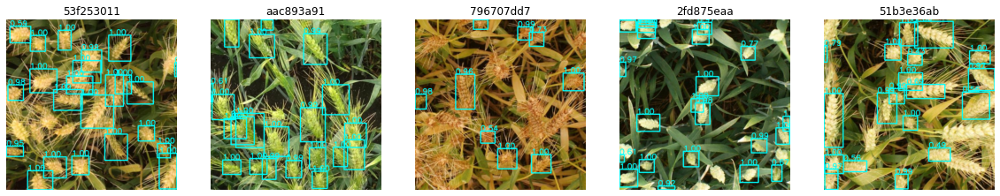

In [ ]:
Im.show_all(predicted_images[:5], ids[:5])

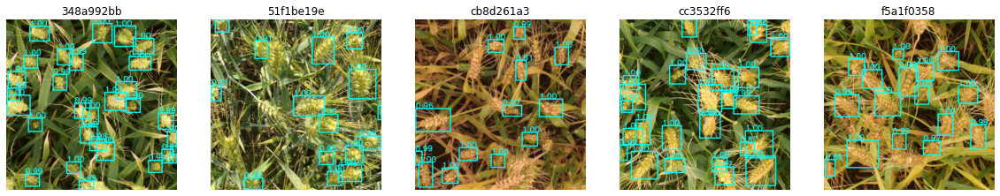

In [ ]:
Im.show_all(predicted_images[5:10], ids[5:10])

Testing one of the Faster RCNN models using VGG backbone, Trained on one of the 5-folds' dataset partition 

In [ ]:
results = test(vgg_rcnn_5f, wheat_testloader)

In [ ]:
predicted_images = [r['image'] for r in results]
ids = [r['image_id'] for r in results]

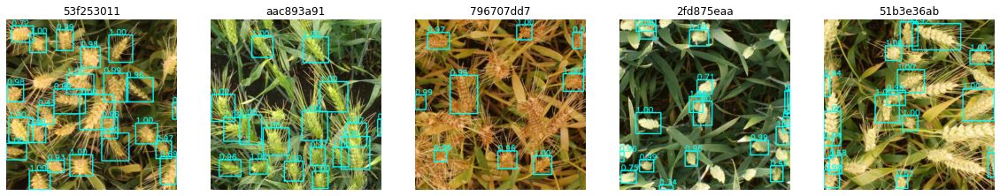

In [ ]:
Im.show_all(predicted_images[:5], ids[:5])

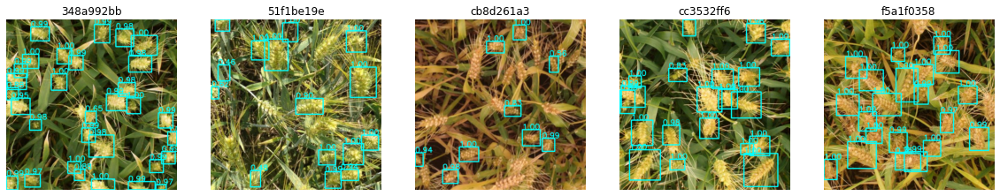

In [ ]:
Im.show_all(predicted_images[5:10], ids[5:10])

Testing one of the Detectron2 models, Trained on one of the 5-folds' dataset partition 

In [ ]:
predicted_images, ids = list(), list()
for images, image_ids in wheat_testloader:
    pred = predictor_1f(images[0])
    boxes = pred['instances'].get_fields()['pred_boxes'].tensor.data.cpu().numpy()
    scores = pred['instances'].get_fields()['scores'].data.cpu().numpy().tolist()
    boxes, scores, labels = filter_targets(boxes, scores, 0.55)
    scores_str = ['{0:.2f}'.format(s) for s in scores]

    predicted_images.append(draw_bboxes(images[0], boxes, scores_str, 1, thickness=3))
    ids.append(image_ids[0])

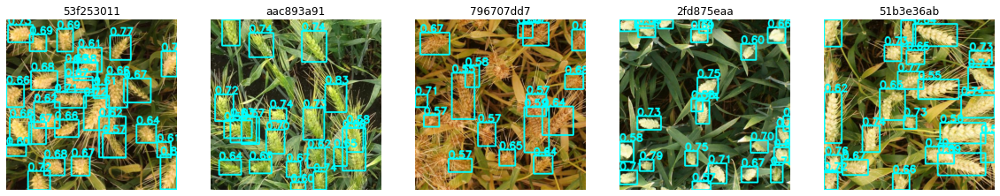

In [ ]:
Im.show_all(predicted_images[:5], ids[:5])

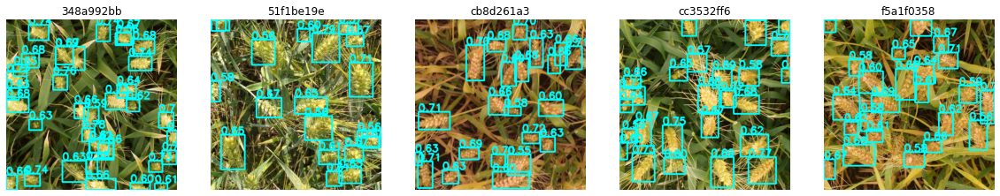

In [ ]:
Im.show_all(predicted_images[5:10], ids[5:10])

Testing YOLOv5

In [ ]:
copy_images(src_path="/content/gdrive/My Drive/global-wheat-detection/test", dest_path="/content/gdrive/My Drive/yolov5/inference/images")

In [ ]:
%cd /content/gdrive/My Drive/yolov5

In [ ]:
!python detect.py --weights weights/best_yolov5x_wheat.pt --img 1024 --conf 0.3 --source ./inference/images/ --save-txt

In [ ]:
predicted_paths = glob.glob("/content/temp/yolov5/inference/output/*.jpg")

In [ ]:
predicted_images, ids = list(), list()
for p in predicted_paths:
    predicted_images.append(plt.imread(p))
    ids.append(str(p[p.rfind('/') + 1 : p.rfind('.')]))

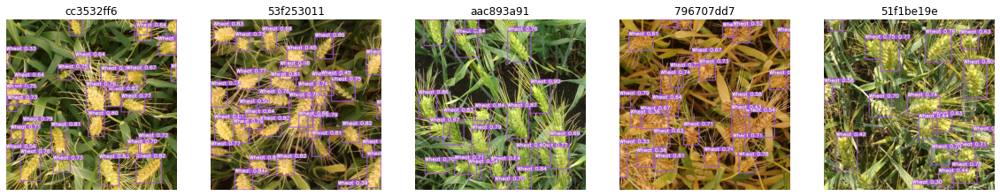

In [ ]:
Im.show_all(predicted_images[:5], ids[:5])

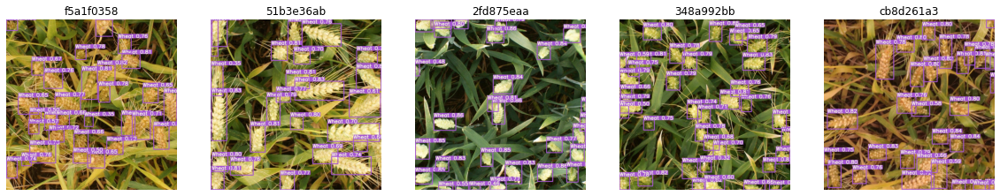

In [ ]:
Im.show_all(predicted_images[5:10], ids[5:10])

In [ ]:
%cd /content/

Ensemble test

In [ ]:
# Loading the models

rcnns = [resnet_rcnn_1f, resnet_rcnn_2f, resnet_rcnn_3f, resnet_rcnn_4f, resnet_rcnn_5f, 
         vgg_rcnn_1f, vgg_rcnn_2f, vgg_rcnn_3f, vgg_rcnn_4f, vgg_rcnn_5f]

detectrons = [predictor_1f, predictor_2f, predictor_3f, predictor_4f, predictor_5f]

yolov5 = torch.load(YOLO_PATH, map_location=device)['model'].float()
yolov5.to(device).eval();

In [ ]:
results = test_ensemble(rcnns, detectrons, yolov5, wheat_testloader, F_MEASURES_PATH_FR, F_MEASURES_PATH_D2)

In [ ]:
predicted_images = [r['image'] for r in results]
ids = [r['image_id'] for r in results]

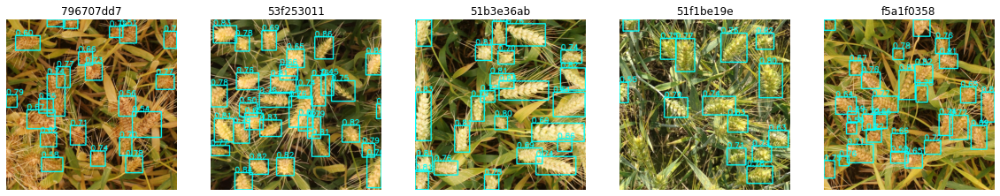

In [ ]:
Im.show_all(predicted_images[:5], ids[:5])

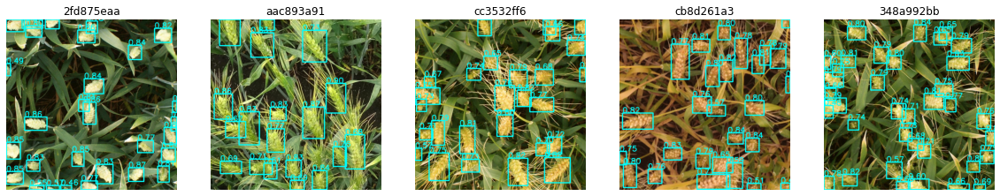

In [ ]:
Im.show_all(predicted_images[5:10], ids[5:10])